Name | Matr.Nr. | Due Date
:--- | ---: | ---:
Mohamed Abdelaziz | 12137202 | 01.04.2022, 08:00

<h1 style="color:rgb(0,120,170)">Hands-on AI II</h1>
<h2 style="color:rgb(0,120,170)">Unit 1 &ndash; Recap Hands-on AI I (Assignment)</h2>

<b>Authors:</b> B. Schäfl, S. Lehner, J. Brandstetter, A. Schörgenhumer<br>
<b>Date:</b> 08-03-2022

This file is part of the "Hands-on AI II" lecture material. The following copyright statement applies to all code within this file.

<b>Copyright statement:</b><br>
This material, no matter whether in printed or electronic form, may be used for personal and non-commercial educational use only. Any reproduction of this material, no matter whether as a whole or in parts, no matter whether in printed or in electronic form, requires explicit prior acceptance of the authors.

<h3 style="color:rgb(0,120,170)">How to use this notebook</h3>

This notebook is designed to run from start to finish. There are different tasks (displayed in <span style="color:rgb(248,138,36)">orange boxes</span>) which require your contribution (in form of code, plain text, ...). Most/All of the supplied functions are imported from the file <code>u1_utils.py</code> which can be seen and treated as a black box. However, for further understanding, you can look at the implementations of the helper functions. In order to run this notebook, the packages which are imported at the beginning of <code>u1_utils.py</code> need to be installed.

<div class="alert alert-warning">
    <b>Important:</b> Set the random seed with <code>u1.set_seed(23)</code> to enable reproducible results in all tasks that incorporate randomness (e.g., t-SNE, splitting data intro train and test sets, initializing weights of a neural network, running the model optimization with random batches, etc.). You must use <code>23</code> as seed.
</div>

In [10]:
# Import pre-defined utilities specific to this notebook.
import u1_utils as u1

# Import additional utilities needed in this notebook.
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch

from pathlib import Path
from PIL import Image
from scipy import signal
from sklearn.neighbors import KNeighborsClassifier

# Set default plotting style.
sns.set()

# Setup Jupyter notebook (warning: this may affect all Jupyter notebooks running on the same Jupyter server).
u1.setup_jupyter()

# Check minimum versions.
u1.check_module_versions()

Installed Python version: 3.8 (✓)
Installed numpy version: 1.22.2 (✓)
Installed pandas version: 1.4.1 (✓)
Installed PyTorch version: 1.10.2+cu113 (✓)
Installed scikit-learn version: 1.0.2 (✓)
Installed scipy version: 1.8.0 (✓)
Installed matplotlib version: 3.5.1 (✓)
Installed seaborn version: 0.11.2 (✓)
Installed PIL version: 9.0.1 (✓)


<h2>1. Tabular data</h2>

<p>In this exercise you'll be working with another famous data set, the <i>iris</i> data set. It is composed of various measurements of physical attributes of iris flowers. The data set distinguishes <i>three</i> different classes, one for each species of iris flower. It was published by:

<center><cite>Fisher,R.A. "The use of multiple measurements in taxonomic problems" Annual Eugenics, 7, Part II, 179-188 (1936)</cite></center>

Currently, it is maintained by the <a href="https://archive.ics.uci.edu/ml">UCI Machine Learning Repository</a>:

<center><cite>Lichman, M. (2013). UCI Machine Learning Repository. Irvine, CA: University of California, School of Information and Computer Science.</cite></center></p>

<div class="alert alert-warning">
    <b>Exercise 1.1. [3 Points]</b>
    <ul>
        <li>Load the <i>iris</i> data set using the appropriate function as supplied by us.</li>
        <li>Split the data set into the feature vector matrix and the label vector.</li>
        <li>Visualize the iris data set in tabular form.</li>
    </ul>
</div>

In [2]:
u1.set_seed(23)
iris_df = u1.load_iris()
iris_X, iris_y = iris_df.drop(columns='species'), iris_df['species']
iris_df

,sepal length,sepal width,petal length,petal width,species
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


<div class="alert alert-warning">
    <b>Exercise 1.2. [2 Points]</b>
    <ul>
        <li>How many samples does the data set contain?</li>
        <li>How many features does the data set consist of (not counting the class label column <i>species</i>)?</li>
        <li>How many different species (classes) are there?</li>
    </ul>
</div>

In [3]:
features = iris_y.unique()
features.size

3

* Number of samples = 150
* Number of Features = 4
* Number of Classes = 3 : [0,1,2]

<div class="alert alert-warning">
    <b>Exercise 1.3. [3 Points]</b>
    <ul>
        <li>Compute a pairplot of the iris data set with respect to <i>all</i> features.</li>
    </ul>
</div>

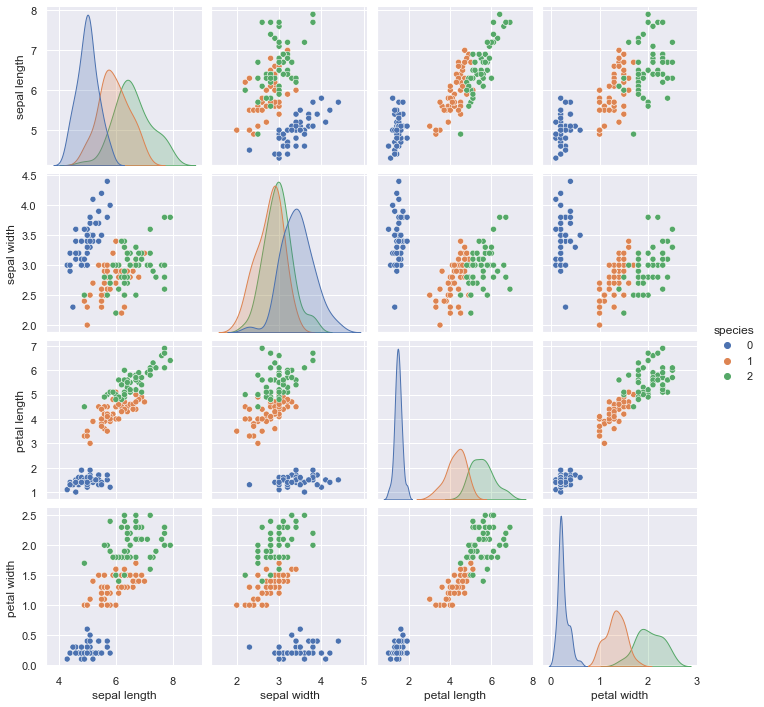

In [4]:
sns.pairplot(iris_df, hue='species', diag_kind='kde', palette=sns.color_palette()[:features.size])
plt.show()

<div class="alert alert-warning">
    <b>Exercise 1.4. [2 Points]</b>
    <ul>
        <li>Which species of iris flower may be linearly separable by which feature(s), if any?</li>
    </ul>
</div>

* species[0] can be linearly separable by all available features 

<div class="alert alert-warning">
    <b>Exercise 1.5. [3 Points]</b>
    <ul>
        <li>Reduce the dimensionality of the iris data set using <i>PCA</i> with 2 components and visualize the downprojection.</li>
    </ul>
</div>

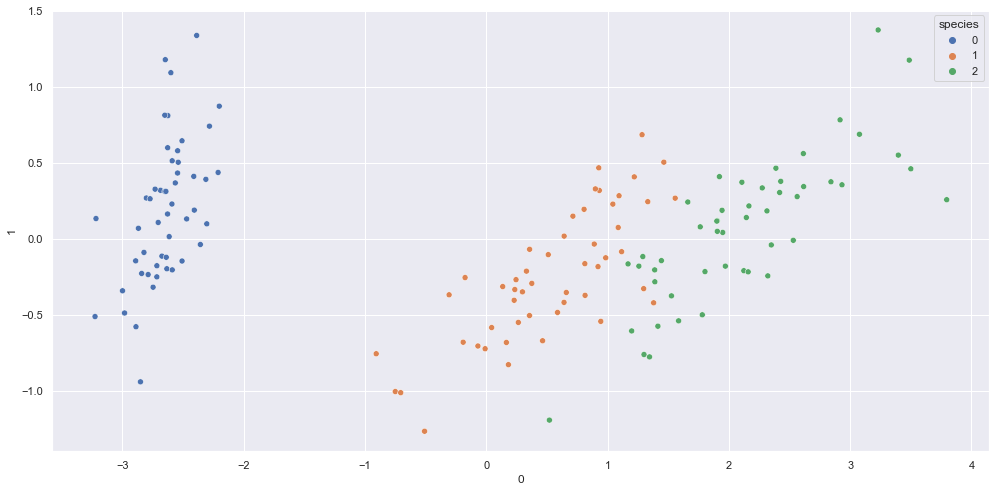

In [5]:
iris_pca = u1.apply_pca(n_components=2, data=iris_X)
u1.plot_points_2d(data=iris_pca, targets=iris_y, figsize=(14, 7))

<div class="alert alert-warning">
    <b>Exercise 1.6. [3 Points]</b>
    <ul>
        <li>Apply <i>$k$-means</i> on the PCA-downprojected data set and plot the resulting clusters.</li>
    </ul>
</div>

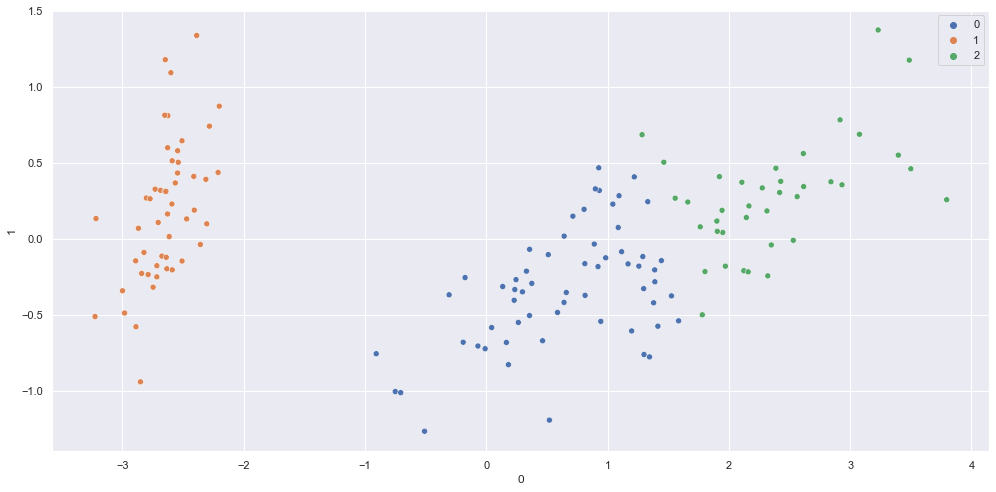

In [6]:
u1.set_seed(23)
iris_pca_kmeans = u1.apply_k_means(k=3, data=iris_pca)
u1.plot_points_2d(data=iris_pca, targets=iris_pca_kmeans, figsize=(14, 7))

<div class="alert alert-warning">
    <b>Exercise 1.7. [3 Points]</b>
    <ul>
        <li>Apply <i>affinity propagation</i> on the PCA-downprojected data set and plot the resulting clusters.</li>
    </ul>
</div>

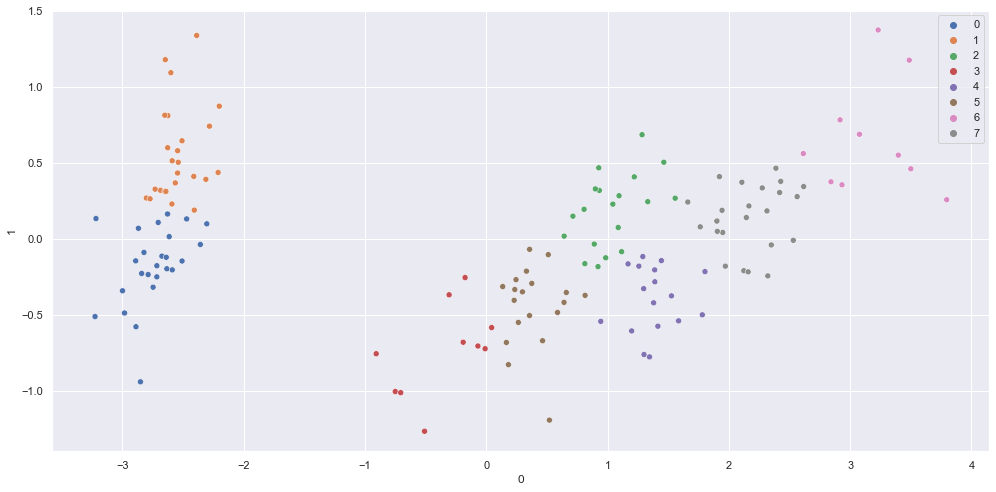

In [7]:
u1.set_seed(23)
iris_aff_pro = u1.apply_affinity_propagation(data=iris_pca)
u1.plot_points_2d(data=iris_pca, targets=iris_aff_pro, figsize=(14, 7))

<div class="alert alert-warning">
    <b>Exercise 1.8. [3 Points]</b>
    <ul>
        <li>Reduce the dimensionality of the iris data set using <i>t-SNE</i> with 2 components and visualize the downprojection.</li>
        <li>Choose a fitting perplexity.</li>
    </ul>
</div>

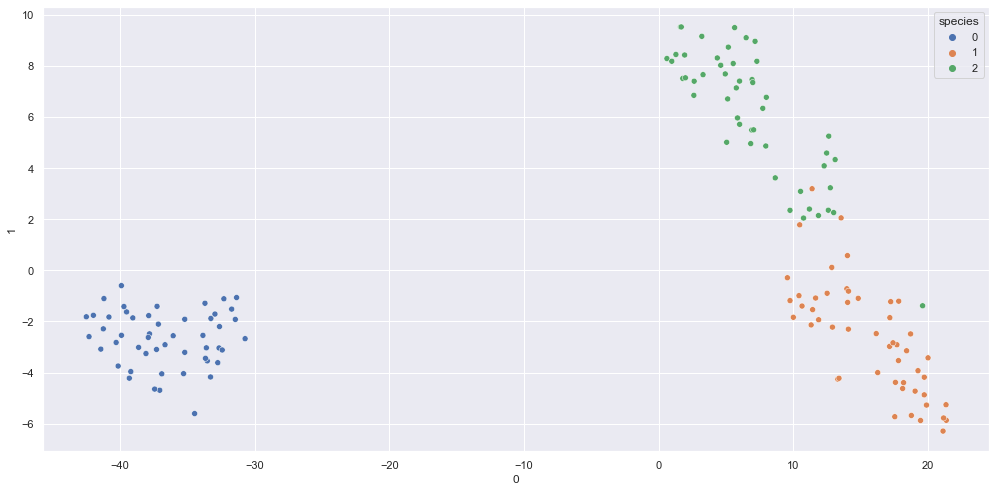

In [8]:
u1.set_seed(23)
iris_tsne = u1.apply_tsne(n_components=2, data=iris_X, perplexity=21)
u1.plot_points_2d(data=iris_tsne, targets=iris_y, figsize=(14, 7))

<div class="alert alert-warning">
    <b>Exercise 1.9. [3 Points]</b>
    <ul>
        <li>Apply <i>$k$-means</i> on the t-SNE-downprojected data set and plot the resulting clusters.</li>
    </ul>
</div>

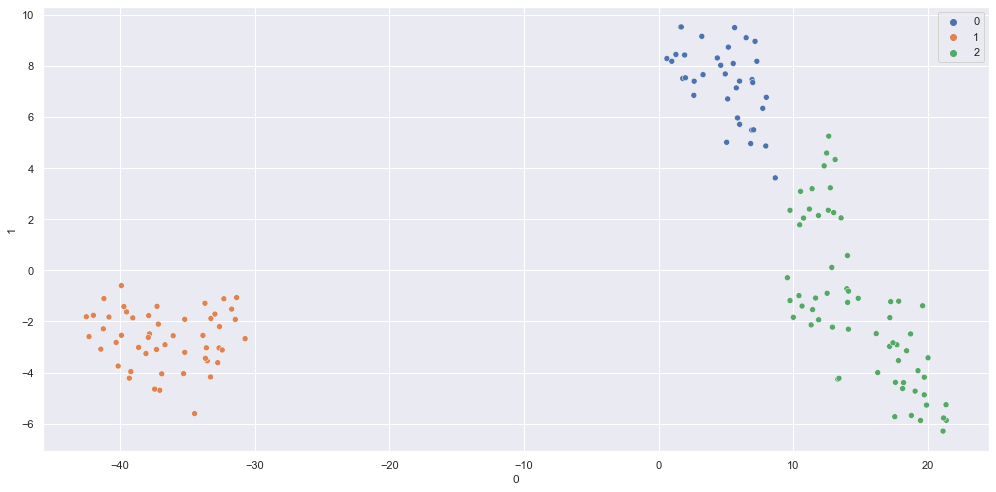

In [9]:
u1.set_seed(23)
iris_tsne_kmeans = u1.apply_k_means(k=3, data=iris_tsne)
u1.plot_points_2d(data=iris_tsne, targets=iris_tsne_kmeans, figsize=(14, 7))

<div class="alert alert-warning">
    <b>Exercise 1.10. [3 Points]</b>
    <ul>
        <li>Apply <i>affinity propagation</i> on the t-SNE-downprojected data set and plot the resulting clusters.</li>
    </ul>
</div>

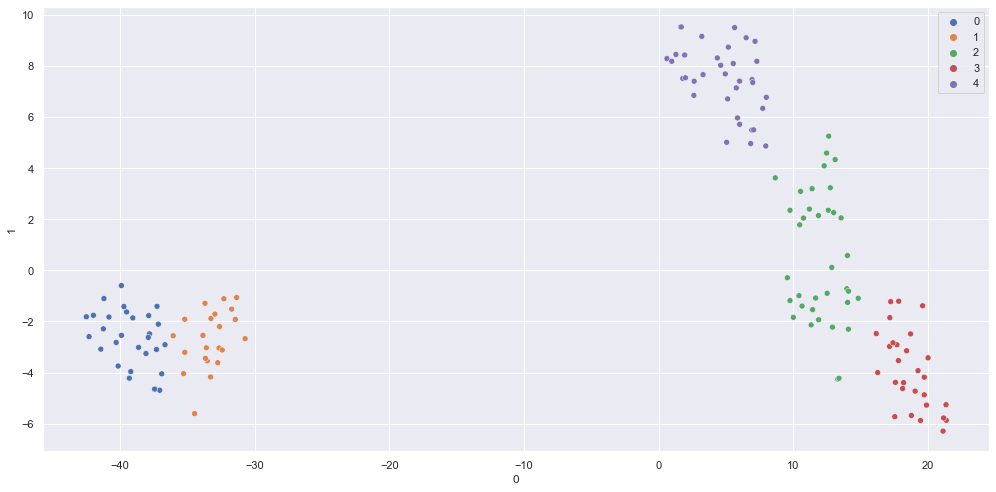

In [10]:
u1.set_seed(23)
iris_aff_pro_tsne = u1.apply_affinity_propagation(data=iris_tsne)
u1.plot_points_2d(data=iris_tsne, targets=iris_aff_pro_tsne, figsize=(14, 7))

<div class="alert alert-warning">
    <b>Exercise 1.11. [2 Points]</b>
    <ul>
        <li>Which combination works best? Interpret your results.</li>
    </ul>
</div>

In [11]:
from sklearn.metrics import silhouette_samples

u1.set_seed(23)
# PCA + KMEANS
sil_vals_pca = silhouette_samples(iris_pca, iris_pca_kmeans)
avg_sil_score_pca = np.mean(sil_vals_pca)
print(f'PCA + KMeans: {avg_sil_score_pca}')

u1.set_seed(23)
sil_vals_tsne = silhouette_samples(iris_tsne, iris_tsne_kmeans)
avg_sil_score_tsne = np.mean(sil_vals_tsne)
print(f'TSNE + KMeans: {avg_sil_score_tsne}')

PCA + KMeans: 0.597676421954799
TSNE + KMeans: 0.6985517144203186


##### The Best Combinations are:

* K-means applied applied on TSNE is the best choice because all species can be linearly seperable [Visually] as well as yilding a silhouette score of 69%

* K-means applied applied on PCA can appear to be a good choice at first because visually they are more linearly separated but yileded a lower score on the silhouette samples in the end.

* Affinity Propagation has failed to recognize the correct number of clusters for all combinations, therefore they are not the best choice.

<h2>2. Sequence data</h2>
<p>In this exercise you'll be working with <i>electricity demand</i> data as collected from the <i>Australian New South Wales Electricity Market</i>. It was first published/described by:</p>

<p><center><cite>M. Harries. Splice-2 comparative evaluation: Electricity pricing. Technical report, The University of South Wales, 1999. </cite></center></p>

Currently, it is maintained by the <a href="https://www.openml.org/d/151">OpenML</a> project:

<center><cite>Joaquin Vanschoren, Jan N. van Rijn, Bernd Bischl, and Luis Torgo. OpenML: networked science in machine learning. SIGKDD Explorations 15(2), pp 49-60, 2013.</cite></center></p>
<center><cite>Matthias Feurer, Jan N. van Rijn, Arlind Kadra, Pieter Gijsbers, Neeratyoy Mallik, Sahithya Ravi, Andreas Mueller, Joaquin Vanschoren, Frank Hutter. OpenML-Python: an extensible Python API for OpenML. arXiv:1911.02490 [cs.LG], 2019</cite></center></p>

<div class="alert alert-warning">
    <b>Exercise 2.1. [2 Points]</b>
    <ul>
        <li>Load the <i>electricty</i> data set using the appropriate function as supplied by us.</li>
        <li>Visualize the electricity data set in tabular form.</li>
    </ul>
</div>

In [12]:
elec_df = u1.load_electricity()
elec_df

,date,day,period,nswprice,nswdemand,vicprice,vicdemand,transfer,demand
0,0.0000,2,0.000000,0.056443,0.439155,0.003467,0.422915,0.414912,UP
1,0.0000,2,0.021277,0.051699,0.415055,0.003467,0.422915,0.414912,UP
2,0.0000,2,0.042553,0.051489,0.385004,0.003467,0.422915,0.414912,UP
3,0.0000,2,0.063830,0.045485,0.314639,0.003467,0.422915,0.414912,UP
4,0.0000,2,0.085106,0.042482,0.251116,0.003467,0.422915,0.414912,DOWN
...,...,...,...,...,...,...,...,...,...
45307,0.9158,7,0.914894,0.044224,0.340672,0.003033,0.255049,0.405263,DOWN
45308,0.9158,7,0.936170,0.044884,0.355549,0.003072,0.241326,0.420614,DOWN
45309,0.9158,7,0.957447,0.043593,0.340970,0.002983,0.247799,0.362281,DOWN
45310,0.9158,7,0.978723,0.066651,0.329366,0.004630,0.345417,0.206579,UP


<div class="alert alert-warning">
    <b>Exercise 2.2. [2 Points]</b>
    <ul>
        <li>How many samples does the data set contain?</li>
        <li>How many features does the data set consist of (not counting the class label column <i>demand</i>)?</li>
    </ul>
</div>

* Number of samples = 45312
* Number of Features = 8
* Number of Classes = 2 [Up, Down]

<div class="alert alert-warning">
    <b>Exercise 2.3. [5 Points]</b>
    <ul>
        <li>Visualize the electricity data set using <i>lineplots</i> with <i>period</i> as the x-axis, once <i>nswdemand</i> and once <i>nswprice</i> as the y-axis, colored by the feature <i>day</i>.</li>
        <li>Do you observe any correlations between both plots?</li>
    </ul>
</div>

Text(0.5, 1.0, 'NSWPrice')

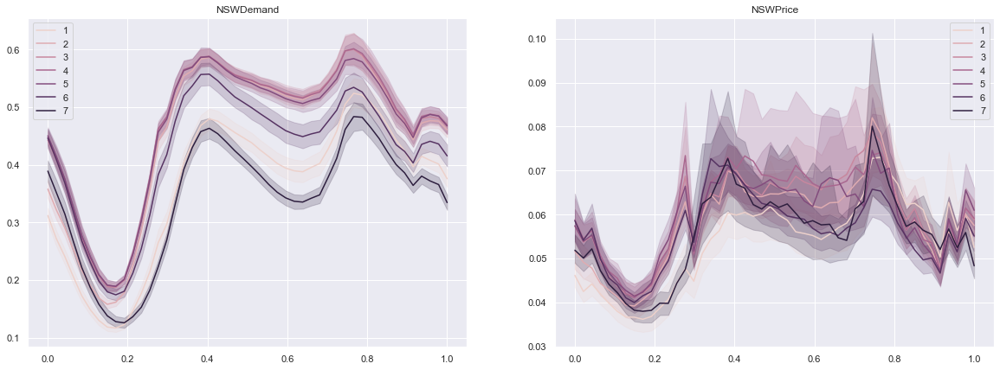

In [13]:
u1.set_seed(23)
elec_periods = elec_df.period.values.tolist()
elec_nswdemand = elec_df.nswdemand.values.tolist()
elec_nswprice = elec_df.nswprice.values.tolist()
elec_day = elec_df.day.values.tolist()

fig, axes = plt.subplots(1,2, sharex=True, figsize=(20, 7))
sns.lineplot(x=elec_periods, y=elec_nswdemand, hue=elec_day, ax=axes[0])
sns.lineplot(x=elec_periods, y=elec_nswprice, hue=elec_day, ax=axes[1])
axes[0].set_title('NSWDemand')
axes[1].set_title('NSWPrice')

<div class="alert alert-warning">
    <b>Exercise 2.4. [2 Points]</b>
    <ul>
        <li>Do you observe any correlations between both plots?</li>
    </ul>
</div>

<AxesSubplot:>

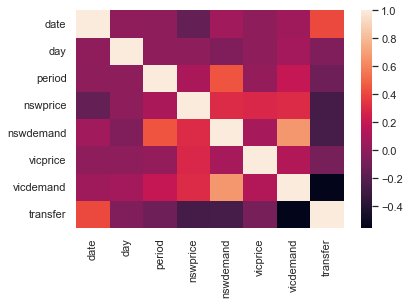

In [14]:
sns.heatmap(elec_df.corr())

* Visually There is a positive correlation between the plotted features [nswprice, nswdemand]
* This also was confirmed by the heatmap of the correlation matrix

<div class="alert alert-warning">
    <b>Exercise 2.5. [9 Points]</b>
    <ul>
        <li>Compute the total electricity demand <i>per day</i> for <i>NSW</i> and <i>VIC</i>, as well as the total electricity transfer. Hint: have a look at the <a href="https://pandas.pydata.org/docs/user_guide/groupby.html#splitting-an-object-into-groups">pandas documentation</a>.</li>
        <li>Since the individual features are normalized to $[0, 1]$, make sure to normalize the sums as well.</li>
        <li>Visualize the total (normalized) electricity demand for <i>NSW</i> and <i>VIC</i>, as well as the total (normalized) electricity transfer (the <i>day</i> should be on the x-axis).</li>
    </ul>
</div>

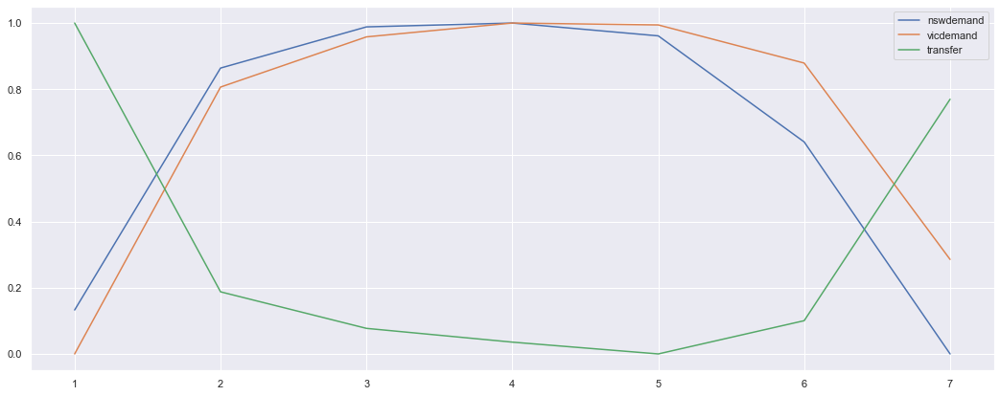

In [15]:
elec_day_group = elec_df.groupby('day')
tepd = elec_day_group[['nswdemand', 'vicdemand', 'transfer']].aggregate(np.sum)
normalized_tepd = (tepd - tepd.min()) / (tepd.max() - tepd.min())

fig, ax = plt.subplots(1, 1, figsize=(18, 7))
ax.set(xticks=normalized_tepd.index.values)
plt.plot(normalized_tepd)
plt.legend(normalized_tepd.columns.tolist())
plt.show()

<div class="alert alert-warning">
    <b>Exercise 2.6. [2 Points]</b>
    <ul>
        <li>Considering the plots above, are these results to be expected, i.e., do they make sense?.</li>
    </ul>
</div>

* According to simple logic, and cosidering the plots, the total electricity demand in each state peaks at the middle of the week [Days: 3,4,5] then drops at the weekend which makes some sense.
* Also during the peak, its unlogical to transfer electricity between both states, and this was confirmed by the chart which makes sense as well.

<h2>3. Image data</h2>

<p>In this exercice you'll be working with a data set composed of various <i>images</i> of fashion items (e.g. shoes or shirts). The data set distinguishes <i>ten</i> different classes, one for each type of fashion item. For curious minds, more information regarding this data set can be found at:

<center><cite>Fashion-MNIST: a Novel Image Dataset for Benchmarking Machine Learning Algorithms. Han Xiao, Kashif Rasul, Roland Vollgraf. arXiv:1708.07747</cite></center>

<div class="alert alert-warning">
    <b>Exercise 3.1. [2 Points]</b>
    <ul>
        <li>Load the <i>Fashion-MNIST</i> data set using the appropriate function as supplied by us.</li>
        <li>Visualize the Fashion-MNIST data set in tabular form.</li>
    </ul>
</div>

In [2]:
u1.set_seed(23)
mnist_df = u1.load_fashion_mnist()
mnist_df

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,item_type
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,114.0,130.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33.0,96.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
69996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
69997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8
69998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


<div class="alert alert-warning">
    <b>Exercise 3.2. [10 Points]</b>
    <ul>
        <li>Define the following filters and apply them on 16 random images from the above data set (with $*$ as the convolution and $\sigma{}$ as the sigmoid operation):</li>
    </ul>
    <p>
        \begin{equation}G_x = \left(
            \begin{array}{rrrrr}
                -1 &  1 &  0 & 1 & -1 \\
                -2 &  2 &  0 & 2 & -2 \\
                -3 &  3 &  0 & 3 & -3 \\
                -2 &  2 &  0 & 2 & -2 \\
                -1 &  1 &  0 & 1 & -1
            \end{array}\right) * \sigma{(A)}
        \end{equation}
    </p>
    <p>
        \begin{equation}G_y = \left(
            \begin{array}{rrrrr}
                 -1 &  -2 &  -3 &  -2  &  -1  \\
                  1 &   2 &   3 &   2  &   1  \\
                  0 &   0 &   0 &   0  &   0  \\
                  1 &   2 &   3 &   2  &   1  \\
                 -1 &  -2 &  -3 &  -2  &  -1
            \end{array}\right) * \sigma{(A)}
        \end{equation}
    </p>
    <ul>
        <li>Hint: Make sure to exclude the class label column <i>item_type</i> before processing your data.</li>
    </ul>
</div>

In [17]:
u1.set_seed(23)

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# from scipy.special import expit as sigmoid

Gx = np.array([
    [-1,1,0,1,-1],
    [-2,2,0,2,-2],
    [-3,3,0,3,-3],
    [-2,2,0,2,-2],
    [-1,1,0,1,-1]])
Gy = Gx.transpose()

rand_images = mnist_df.sample(n=16)
rand_X, rand_y = rand_images.drop(columns='item_type').values.reshape(16,28,28), rand_images['item_type']

conv_Gx, conv_Gy, sig = np.empty(shape=rand_X.shape), np.empty(shape=rand_X.shape), np.empty(shape=rand_X.shape)

for i in range(rand_X.shape[0]):
    np.append(sig, sigmoid(rand_X[i]))
    np.append(conv_Gx, signal.convolve2d(sig[i], Gx, mode='same'))
    np.append(conv_Gy, signal.convolve2d(sig[i], Gx, mode='same'))


rand_X.shape = (*rand_X.shape, 1)
sig.shape = (rand_X.shape)
conv_Gx.shape = (*conv_Gx.shape, 1)
conv_Gy.shape = (*conv_Gy.shape, 1)

sig.shape

(16, 28, 28, 1)

<div class="alert alert-warning">
    <b>Exercise 3.3. [3 Points]</b>
    <ul>
        <li>Using the data of the 16 samples from above, create a plot with 4 rows (or 4 columns, choose what you like), where</li>
        <ul>
            <li>(1) shows the original samples</li>
            <li>(2) shows the samples after the sigmoid function</li>
            <li>(3) shows the samples after the convolution with $G_x$</li>
            <li>(4) shows the samples after the convolution with $G_y$</li>
        </ul>
    </ul>
</div>

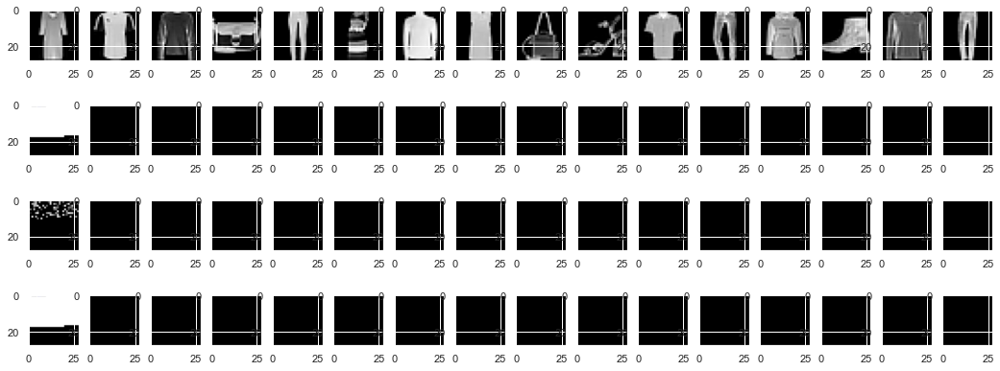

In [19]:
figs, axes = plt.subplots(4, 16, figsize=(18,7))
for i in range(16):
    axes[0,i].imshow(rand_X[i], cmap='gray')
    axes[1,i].imshow(sig[i], cmap='gray')
    axes[2,i].imshow(conv_Gx[i], cmap='gray')
    axes[3,i].imshow(conv_Gy[i], cmap='gray')

<div class="alert alert-warning">
    <b>Exercise 3.4. [5 Points]</b>
    <ul>
        <li>Implement a function for computing the output size of a convolution (<a href="https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html">documentation</a>) or max pooling (<a href="https://pytorch.org/docs/stable/generated/torch.nn.MaxPool2d.html">documentation</a>) operation, given some input size.</li>
    </ul>
</div>

In [3]:
import math
def conv_size(size, padding=(0,0), dilation=(1,1), kernel_size=(3,3), stride=None, max_pool=False):

    # Default Stride Value
    if not stride:
        if max_pool:
            stride = kernel_size
        else:
            stride = (1,1)
        
    # Validate Input Size
    assert (len(size) == 2) or (len(size) == 3)
    # Validate Kwargs types
    assert isinstance(padding, (tuple, list, int))
    assert isinstance(dilation, (tuple, list, int))
    assert isinstance(kernel_size, (tuple, list, int))
    assert isinstance(stride, (tuple, list, int))

    if len(size) == 2:
        size = (None, *size)
            
    padding = padding if isinstance(padding, (tuple, list)) else (int(padding), int(padding))
    dilation = dilation if isinstance(dilation, (tuple, list)) else (int(dilation), int(dilation))
    kernel_size = kernel_size if isinstance(kernel_size, (tuple, list)) else (int(kernel_size), int(kernel_size))
    stride = stride if isinstance(stride, (tuple, list)) else (int(stride), int(stride))

    if not max_pool:
        H_o = math.floor(size[1] + 2 * padding[0] - dilation[0] * (kernel_size[0] - 1) -1 / stride[0] + 1)
        W_o = math.floor(size[2] + 2 * padding[1] - dilation[1] * (kernel_size[1] - 1) -1 / stride[1] + 1)
    else:
        H_o = math.floor(((size[1] - kernel_size[0])/stride[0])+1)
        W_o = math.floor(((size[2] - kernel_size[1])/stride[1])+1)

    return (int(H_o), int(W_o))

<div class="alert alert-warning">
    <b>Exercise 3.5. [10 Points]</b>
    <ul>
        <li>Implement a class <code>CNN</code> that derives from <code>torch.nn.Module</code> with the following architecture:</li>
    </ul>
    <table style="text-align:center;vertical-align:middle">
        <th>Position</th>
        <th>Element</th>
        <th>Comment</th>
        <tr>
            <td>0</td>
            <td>input</td>
            <td>input size = $28\times{}28$</td>
        </tr>
        <tr>
            <td>1</td>
            <td>2D convolution</td>
            <td>$16$ output channels and a kernel size of $5\times{}5$</td>
        </tr>
        <tr>
            <td>2</td>
            <td>ReLU</td>
            <td>-</td>
        </tr>
        <tr>
            <td>3</td>
            <td>max pooling</td>
            <td>kernel size of $2\times{}2$</td>
        </tr>
        <tr>
            <td>4</td>
            <td>2D convolution</td>
            <td>$32$ output channels and a kernel size of $3\times{}3$</td>
        </tr>
        <tr>
            <td>5</td>
            <td>ReLU</td>
            <td>-</td>
        </tr>
        <tr>
            <td>6</td>
            <td>max pooling</td>
            <td>kernel size of $2\times{}2$</td>
        </tr>
        <tr>
            <td>7</td>
            <td>2D convolution</td>
            <td>$32$ output channels and a kernel size of $3\times{}3$</td>
        </tr>
        <tr>
            <td>8</td>
            <td>ReLU</td>
            <td>-</td>
        </tr>
        <tr>
            <td>9</td>
            <td>fully connected</td>
            <td>$96$ output features</td>
        </tr>
        <tr>
            <td>10</td>
            <td>ReLU</td>
            <td>-</td>
        </tr>
        <tr>
            <td>11</td>
            <td>fully connected</td>
            <td>$10$ output features</td>
        </tr>
    </table>
    <ul>
        <li>Make sure to utilize the function from above to calculate the different output sizes.</li>
    </ul>
</div>

In [4]:
class CNN(torch.nn.Module):
    """
    CNN tailored to process Fashion-MNIST data.
    """
    
    def __init__(self):
        super().__init__()
        self.conv1 = torch.nn.Conv2d(1, 16, 5)
        self.channel_size = conv_size((1, 28, 28), kernel_size=5)
        self.maxp1 = torch.nn.MaxPool2d(2)
        self.channel_size = conv_size(self.channel_size, kernel_size=2, max_pool=True)

        self.conv2 = torch.nn.Conv2d(16, 32, 3)
        self.channel_size = conv_size(self.channel_size, kernel_size=3)

        self.maxp2 = torch.nn.MaxPool2d(2)
        self.channel_size = conv_size(self.channel_size, kernel_size=2, max_pool=True)

        self.conv3 = torch.nn.Conv2d(32, 32, 3)
        self.channel_size = conv_size(self.channel_size, kernel_size=3)

        self.fc1 = torch.nn.Linear(32 * self.channel_size[0] * self.channel_size[1], 96)
        self.fc2 = torch.nn.Linear(96, 10)
        
        self.flatten = torch.nn.Flatten()
        self.relu = torch.nn.ReLU()
        
        self.softmax = torch.nn.Softmax(dim=1)

        print(self.channel_size)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv1(x)
        x = self.relu(x)
        x = self.maxp1(x)
        
        x = self.conv2(x)
        x = self.relu(x)
        x = self.maxp2(x)
        
        x = self.conv3(x)
        x = self.relu(x)
        
        x = self.flatten(x)
        
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        
#         x = self.softmax(x)

        return x
CNN()

(3, 3)


CNN(
  (conv1): Conv2d(1, 16, kernel_size=(5, 5), stride=(1, 1))
  (maxp1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
  (maxp2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=288, out_features=96, bias=True)
  (fc2): Linear(in_features=96, out_features=10, bias=True)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (relu): ReLU()
  (softmax): Softmax(dim=1)
)

<div class="alert alert-warning">
    <b>Exercise 3.6. [3 Points]</b>
    <ul>
        <li>Split the Fashion-MNIST data set in a <i>training</i> as well as <i>test</i> set in a ratio of $5 : 1$.</li>
        <li>Print the corresponding sizes.</li>
    </ul>
</div>

In [5]:
u1.set_seed(23)

mnist_train, mnist_test = u1.split_data(mnist_df, test_size=1/6)
print(f'Trainingset Shape: {mnist_train.shape}\nTestset Shape: {mnist_test.shape}')

Trainingset Shape: (58333, 785)
Testset Shape: (11667, 785)


<div class="alert alert-warning">
    <b>Exercise 3.7. [5 Points]</b>
    <ul>
        <li>Create a corresponding <tt>TensorDataset</tt> for the training as well as the test set.</li>
        <li>Wrap the previously defined <tt>TensorDataset</tt> instances in separate <tt>DataLoader</tt> instances with a batch size of $48$ (shuffle the training data set).</li>
    </ul>
</div>

In [6]:
u1.set_seed(23)
mnist_train_dataset = dataset=torch.utils.data.TensorDataset(
        torch.from_numpy(mnist_train.drop(columns=['item_type']).values).reshape(len(mnist_train), 1, 28, 28),
        torch.from_numpy(mnist_train['item_type'].values))

mnist_test_dataset = dataset=torch.utils.data.TensorDataset(
        torch.from_numpy(mnist_test.drop(columns=['item_type']).values).reshape(len(mnist_test), 1, 28, 28),
        torch.from_numpy(mnist_test['item_type'].values))


u1.set_seed(23)
mnist_train_loader = torch.utils.data.DataLoader(mnist_train_dataset, batch_size=48, shuffle=True)
mnist_test_loader = torch.utils.data.DataLoader(mnist_test_dataset, batch_size=48, shuffle=True)

<div class="alert alert-warning">
    <b>Exercise 3.8. [10 Points]</b>
    <ul>
        <li>Train a <code>CNN</code> network (an instance of your model defined above) for $4$ epochs, print the training accuracy as well as the loss per epoch, and print the final test set loss and accuracy.</li>
    </ul>
</div>

In [12]:
# Set random seed for reproducibility.
u1.set_seed(23)

# Create CNN instance and the corresponding optimizer to use.
target_device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
cnn_model = CNN().to(target_device)
optimizer = torch.optim.SGD(cnn_model.parameters(), lr=1e-3)

# Train and evaluate CNN instance on the Fashion-MNIST training set.
num_epochs = 4
for epoch in range(num_epochs):
    # Train CNN instance for one epoch.
    u1.train_network(
        model=cnn_model,
        data_loader=mnist_train_loader,
        device=target_device,
        optimizer=optimizer)
    
    # Evaluate current CNN instance.
    performance = u1.test_network(
        model=cnn_model,
        data_loader=mnist_train_loader,
        device=target_device)
    
    # Print result of current epoch to standard out.
    print(f'Epoch: {str(epoch + 1).zfill(len(str(num_epochs)))} ' +
          f'/ Train loss: {performance[0]:.4f} / Train accuracy: {performance[1]:.4f}')

# Evaluate final model on test data set.
performance = u1.test_network(
    model=cnn_model,
    data_loader=mnist_test_loader,
    device=target_device)
print(f'\nTest loss: {performance[0]:.4f} / Test accuracy: {performance[1]:.4f}')

(3, 3)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 199.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  92.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([2, 1, 4, 6, 2, 6, 9, 3, 5, 3, 7, 9, 9, 0, 1, 9, 6, 6, 9, 0, 7, 5, 4, 3,
        0, 8, 1, 8, 3, 2, 4, 7, 3, 3, 2, 2, 5, 4, 3, 2, 5, 4, 8, 7, 9, 8, 0, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([9, 2, 0, 8, 9, 6, 7, 8, 1, 9, 8, 0, 7, 2, 7, 1, 4, 0, 1, 9, 4, 5, 9, 3,
        2, 2, 9, 6, 4, 2, 6, 4, 9, 3, 9, 7, 6, 4, 9, 1, 7, 4, 9, 5, 7, 6, 8, 4],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 154.,   0.,   0.],
          [  0.,   0.,   4.,  ...,  34.,   0.,   0.],
          [  0.,   0.,   2.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0., 

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([5, 7, 0, 1, 8, 4, 2, 8, 4, 5, 0, 3, 6, 7, 5, 4, 7, 2, 3, 1, 7, 9, 6, 2,
        5, 0, 8, 4, 6, 1, 9, 5, 8, 9, 1, 4, 4, 8, 5, 4, 8, 2, 7, 8, 5, 4, 0, 9],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   1.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   1.,   0.,   0.],
          [  0.,   0.,   2.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   1.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,  91.,  ..., 116.,  49.,   0.],
          [  0.,   0., 156.,  ..., 211., 170.,   0.],
          [  0.,   0.,   0.,  ...,  43.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([3, 9, 4, 1, 9, 6, 7, 2, 7, 0, 7, 4, 4, 9, 8, 1, 0, 1, 6, 7, 9, 3, 3, 4,
        1, 4, 6, 2, 4, 5, 4, 8, 7, 0, 4, 8, 4, 8, 5, 5, 4, 3, 9, 2, 2, 1, 1, 6],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([3, 1, 1, 4, 8, 1, 9, 6, 1, 0, 3, 5, 7, 0, 2, 2, 5, 3, 5, 4, 2, 3, 0, 0,
        5, 6, 2, 1, 2, 1, 0, 4, 2, 0, 0, 8, 5, 3, 6, 9, 0, 9, 5, 1, 6, 8, 3, 1],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([8, 0, 0, 3, 4, 2, 8, 6, 8, 4, 5, 5, 3, 3, 6, 3, 2, 2, 4, 7, 4, 7, 6, 2,
        0, 7, 7, 9, 8, 2, 6, 4, 5, 9, 7, 6, 2, 6, 5, 8, 0, 7, 4, 3, 7, 6, 3, 4],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([6, 9, 6, 8, 6, 8, 4, 9, 0, 9, 3, 6, 9, 0, 8, 7, 7, 7, 3, 3, 7, 2, 8, 1,
        5, 4, 0, 4, 9, 1, 4, 7, 8, 4, 9, 0, 8, 0, 2, 8, 6, 5, 2, 4, 4, 6, 4, 6],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        ...,


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0., 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([4, 2, 0, 8, 6, 5, 3, 8, 9, 8, 0, 9, 2, 8, 4, 3, 4, 3, 9, 0, 8, 8, 0, 9,
        2, 2, 4, 7, 0, 1, 5, 0, 8, 9, 8, 7, 3, 3, 2, 8, 4, 1, 3, 0, 3, 2, 6, 1],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [ 20., 134., 106.,  ...,   0.,   0.,  27.],
          ...,
          [  0.,   0.,   0.,  ..., 113.,   9.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([9, 2, 2, 4, 5, 9, 3, 0, 2, 3, 3, 4, 2, 9, 5, 6, 6, 4, 8, 0, 2, 6, 9, 1,
        1, 8, 9, 0, 4, 3, 9, 1, 2, 3, 5, 8, 1, 2, 4, 9, 2, 8, 2, 4, 1, 9, 9, 6],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([1, 8, 8, 3, 6, 7, 5, 1, 7, 2, 5, 6, 5, 6, 8, 8, 3, 7, 5, 0, 3, 2, 5, 1,
        9, 8, 3, 5, 4, 1, 1, 6, 8, 3, 5, 6, 5, 6, 9, 6, 5, 1, 7, 9, 7, 9, 7, 8],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,  36., 225.,  ...,   0.,   3.,   0.],
          [  0.,   0.,  24.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 8, 0, 1, 9, 3, 6, 7, 9, 2, 6, 4, 2, 7, 7, 2, 1, 2, 0, 2, 6, 0, 0, 5,
        6, 6, 0, 2, 9, 9, 0, 2, 7, 2, 8, 4, 3, 0, 0, 3, 5, 6, 3, 2, 2, 2, 3, 3],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 1., 0., 0.],
          [0., 0., 0.,  ..., 1., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 2, 8, 6, 3, 6, 4, 5, 0, 1, 0, 2, 7, 1, 2, 0, 6, 3, 6, 0, 1, 3, 3, 1,
        4, 6, 5, 6, 6, 6, 0, 8, 4, 4, 8, 4, 4, 7, 9, 5, 9, 3, 1, 4, 0, 1, 8, 4],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([6, 2, 2, 8, 0, 8, 7, 5, 7, 2, 3, 4, 7, 9, 6, 7, 5, 8, 2, 6, 9, 9, 6, 6,
        5, 8, 0, 2, 7, 5, 9, 6, 3, 0, 5, 4, 2, 8, 6, 9, 7, 5, 2, 5, 6, 0, 7, 1],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [ 37., 127.,  69.,  ...,  97., 120.,   0.],
          ...,
          [ 57., 255., 224.,  ..., 244., 171.,   0.],
          [  0., 113., 134.,  ..., 131.,   8.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([1, 2, 2, 1, 4, 6, 7, 2, 0, 6, 9, 2, 7, 0, 3, 9, 3, 3, 1, 9, 3, 3, 4, 2,
        9, 7, 5, 8, 0, 9, 7, 2, 4, 7, 9, 0, 9, 8, 5, 9, 4, 9, 3, 3, 0, 9, 8, 9],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,  32.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   3.,   0.,   0.],
          [  0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 3, 1, 5, 1, 1, 6, 2, 5, 4, 1, 9, 2, 5, 0, 9, 2, 5, 1, 0, 2, 5, 7, 3,
        7, 8, 6, 5, 8, 7, 5, 7, 9, 3, 7, 5, 4, 7, 6, 5, 3, 7, 4, 9, 8, 5, 9, 1],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 173.,   0.,   0.],
          [  0.,   0.,   0.,  ..., 219.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  65.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([7, 0, 0, 4, 4, 0, 3, 1, 8, 7, 0, 8, 5, 5, 9, 2, 6, 8, 8, 8, 1, 7, 1, 2,
        6, 9, 1, 7, 6, 6, 7, 7, 4, 8, 9, 2, 5, 6, 1, 0, 8, 7, 7, 0, 1, 5, 4, 5],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([2, 0, 1, 2, 1, 4, 7, 3, 2, 2, 6, 1, 8, 8, 6, 7, 3, 2, 4, 4, 3, 8, 7, 5,
        3, 4, 2, 6, 3, 5, 5, 6, 3, 9, 7, 7, 6, 4, 3, 1, 7, 1, 3, 0, 3, 8, 4, 7],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   4.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 192., 176.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([1, 6, 4, 7, 4, 1, 3, 5, 4, 6, 2, 7, 5, 5, 7, 4, 0, 2, 7, 4, 5, 1, 9, 7,
        2, 7, 0, 4, 5, 4, 1, 4, 1, 1, 1, 0, 7, 9, 6, 1, 0, 2, 0, 1, 2, 5, 0, 5],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 9, 5, 3, 6, 0, 4, 4, 9, 1, 4, 6, 9, 9, 7, 7, 7, 0, 6, 6, 0, 5, 1, 1,
        2, 2, 3, 7, 9, 3, 1, 9, 1, 5, 4, 9, 3, 7, 8, 4, 2, 7, 7, 3, 6, 7, 1, 5],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   2.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 113.,   0.,   0.],
          [  0.,   0.,   0.,  ..., 100.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  63.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 5, 5, 7, 3, 1, 5, 5, 9, 7, 9, 5, 9, 6, 5, 2, 2, 7, 2, 9, 4, 9, 8, 0,
        9, 0, 6, 1, 3, 6, 4, 5, 6, 6, 3, 6, 1, 8, 8, 1, 6, 4, 2, 1, 6, 5, 2, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([3, 2, 3, 1, 2, 0, 0, 0, 7, 5, 6, 2, 2, 8, 3, 4, 2, 9, 6, 0, 8, 7, 4, 5,
        4, 9, 0, 9, 3, 2, 7, 8, 5, 8, 8, 2, 4, 9, 3, 9, 1, 1, 5, 4, 1, 0, 1, 2],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([3, 0, 2, 4, 0, 0, 1, 9, 2, 9, 4, 1, 8, 2, 5, 4, 9, 9, 2, 3, 7, 2, 1, 0,
        0, 6, 9, 2, 3, 5, 0, 8, 0, 0, 3, 9, 4, 4, 8, 4, 2, 8, 0, 1, 6, 0, 9, 6],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([4, 4, 9, 3, 7, 7, 7, 0, 2, 0, 4, 5, 1, 5, 9, 7, 9, 8, 0, 8, 7, 8, 3, 0,
        1, 0, 8, 5, 5, 0, 3, 9, 3, 1, 4, 6, 4, 8, 6, 3, 6, 8, 1, 8, 0, 4, 4, 6],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        ...,


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([0, 9, 0, 4, 8, 0, 1, 1, 3, 6, 1, 1, 4, 3, 6, 6, 1, 7, 3, 3, 0, 6, 0, 4,
        9, 6, 6, 3, 7, 8, 5, 1, 0, 5, 4, 0, 8, 4, 2, 8, 7, 0, 7, 2, 5, 7, 1, 6],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 1., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([4, 4, 8, 2, 7, 6, 5, 9, 4, 7, 6, 8, 7, 4, 2, 4, 7, 9, 2, 2, 7, 8, 6, 8,
        1, 4, 0, 4, 2, 0, 0, 5, 9, 6, 7, 2, 0, 5, 2, 7, 3, 4, 7, 5, 1, 2, 3, 5],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([1, 2, 3, 6, 9, 3, 8, 7, 2, 7, 0, 0, 4, 6, 7, 1, 3, 5, 7, 9, 0, 7, 0, 0,
        7, 2, 0, 1, 0, 7, 2, 7, 7, 9, 1, 3, 3, 8, 7, 1, 9, 0, 3, 7, 4, 2, 4, 0],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([5, 5, 8, 1, 9, 0, 8, 6, 5, 6, 0, 8, 2, 4, 9, 3, 3, 1, 5, 5, 0, 4, 3, 7,
        3, 2, 1, 0, 6, 0, 8, 0, 8, 4, 4, 2, 0, 1, 5, 7, 0, 2, 8, 3, 5, 6, 7, 5],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 2, 8, 8, 8, 5, 8, 7, 1, 9, 5, 2, 6, 5, 2, 4, 5, 9, 4, 8, 6, 7, 1, 7,
        8, 5, 9, 8, 2, 3, 4, 4, 2, 9, 0, 0, 9, 6, 5, 4, 8, 1, 3, 4, 7, 8, 1, 3],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [1., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([2, 3, 7, 7, 0, 6, 8, 9, 0, 1, 5, 0, 2, 7, 8, 1, 4, 8, 7, 7, 8, 4, 5, 5,
        1, 8, 8, 2, 8, 8, 3, 8, 4, 2, 8, 9, 9, 9, 0, 5, 6, 4, 0, 0, 2, 6, 1, 1],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 1.,  ..., 1., 0., 0.],
          [0., 0., 1.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        ...,


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([2, 0, 0, 5, 3, 1, 2, 6, 5, 5, 1, 3, 1, 1, 4, 6, 1, 4, 5, 1, 4, 7, 8, 0,
        5, 6, 3, 3, 8, 6, 3, 5, 7, 1, 7, 8, 1, 8, 4, 1, 5, 3, 6, 4, 5, 9, 3, 8],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,  62.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  17.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([0, 8, 5, 1, 8, 9, 5, 2, 8, 3, 3, 4, 6, 8, 3, 0, 6, 8, 8, 5, 1, 2, 5, 2,
        8, 5, 9, 4, 9, 7, 4, 6, 5, 0, 7, 1, 0, 7, 8, 9, 9, 4, 8, 4, 0, 9, 1, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([0, 8, 0, 1, 1, 1, 1, 2, 0, 8, 4, 5, 9, 0, 9, 8, 3, 3, 8, 0, 7, 2, 9, 5,
        5, 4, 9, 4, 5, 5, 4, 0, 3, 5, 1, 9, 5, 4, 9, 7, 1, 2, 1, 0, 3, 9, 9, 4],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  1.,  0.,  0.]

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([6, 1, 9, 6, 0, 2, 2, 6, 3, 6, 0, 6, 8, 2, 0, 2, 6, 8, 6, 1, 6, 4, 0, 1,
        1, 3, 5, 1, 8, 4, 9, 4, 8, 2, 2, 6, 7, 9, 3, 5, 3, 4, 9, 8, 2, 9, 3, 9],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([3, 7, 5, 7, 2, 9, 5, 7, 1, 6, 1, 4, 9, 3, 8, 0, 0, 7, 6, 1, 3, 0, 4, 8,
        4, 4, 1, 0, 2, 6, 8, 9, 4, 0, 4, 8, 0, 3, 5, 8, 9, 5, 5, 5, 0, 2, 2, 4],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([8, 3, 6, 9, 2, 6, 1, 9, 9, 2, 9, 1, 1, 9, 0, 9, 5, 6, 7, 0, 4, 0, 9, 2,
        6, 1, 7, 0, 7, 4, 1, 1, 7, 5, 6, 7, 9, 0, 7, 8, 7, 6, 7, 4, 6, 5, 2, 4],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   3.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 113.,   0.,   0.],
          [  0.,   0.,   0.,  ..., 119.,   0.,   0.],
          [  0.,   0.,   0.,  ..., 113.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([8, 4, 4, 5, 5, 9, 6, 2, 8, 5, 8, 9, 7, 5, 0, 9, 0, 5, 8, 8, 0, 2, 8, 1,
        6, 3, 6, 0, 6, 9, 4, 1, 4, 5, 8, 5, 1, 2, 6, 9, 1, 6, 8, 7, 8, 4, 6, 9],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([0, 6, 0, 8, 4, 1, 2, 0, 4, 0, 0, 6, 4, 5, 3, 0, 6, 2, 4, 5, 3, 6, 9, 2,
        0, 4, 4, 2, 3, 7, 6, 5, 4, 4, 6, 6, 0, 9, 8, 0, 0, 4, 9, 4, 7, 0, 3, 8],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  1.,  ...,  1.,  0.,  0.],
          [ 0.,  0.,  1.,  ...,  0.,  0.,  0.],
          [ 0.,  2.,  3.,  ...,  2.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  1.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  1.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  2.,  0.,  0.],
          [ 0.,  0., 14.,  ..., 30.,  0.,  0.],
          [ 0.,  0., 61.,  ..., 64.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  2.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([6, 9, 8, 0, 3, 6, 9, 1, 6, 4, 2, 5, 8, 1, 8, 8, 5, 3, 7, 3, 8, 3, 6, 8,
        5, 5, 1, 2, 5, 4, 4, 6, 5, 9, 6, 4, 5, 8, 7, 9, 6, 0, 1, 1, 4, 0, 3, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 1.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 1.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([4, 2, 4, 5, 0, 2, 9, 8, 5, 8, 0, 8, 3, 6, 9, 5, 4, 2, 7, 5, 3, 6, 5, 6,
        7, 4, 7, 8, 4, 3, 1, 9, 4, 4, 6, 2, 1, 8, 1, 5, 6, 4, 7, 9, 7, 2, 9, 1],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([6, 5, 8, 9, 5, 9, 3, 4, 0, 8, 9, 0, 3, 5, 4, 0, 7, 2, 7, 3, 7, 5, 8, 8,
        5, 8, 4, 8, 7, 4, 3, 7, 4, 2, 4, 2, 8, 6, 1, 2, 1, 3, 3, 3, 7, 2, 6, 1],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([1, 4, 0, 0, 3, 1, 6, 4, 9, 7, 4, 6, 8, 3, 0, 4, 5, 5, 5, 9, 0, 8, 5, 6,
        2, 9, 6, 5, 9, 1, 5, 4, 2, 9, 3, 5, 8, 4, 7, 5, 3, 9, 0, 9, 2, 9, 1, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([2, 7, 8, 2, 6, 6, 1, 3, 2, 7, 8, 6, 5, 7, 9, 5, 9, 6, 3, 8, 7, 3, 5, 6,
        1, 4, 1, 7, 2, 4, 8, 1, 3, 6, 1, 8, 7, 8, 3, 4, 5, 1, 9, 0, 0, 3, 2, 4],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 5, 4, 7, 0, 6, 5, 4, 6, 5, 5, 8, 0, 6, 1, 2, 0, 4, 1, 4, 9, 5, 4, 0,
        1, 3, 4, 5, 5, 0, 4, 9, 4, 4, 9, 2, 7, 5, 0, 0, 6, 3, 0, 4, 8, 6, 1, 5],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 3, 9, 3, 8, 7, 7, 5, 5, 1, 6, 4, 7, 8, 0, 7, 9, 2, 3, 5, 4, 2, 9, 4,
        6, 9, 2, 5, 8, 6, 4, 5, 0, 0, 5, 3, 1, 3, 8, 9, 8, 7, 0, 8, 9, 3, 5, 1],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,  59., 206.,  ..., 141., 154., 113.],
          [  0.,  78., 164.,  ..., 165., 189., 114.],
          [  0.,   0.,  33.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  3.,   0.,   0.,  ..., 194.,  30.,   0.],
          [  3.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([5, 0, 0, 5, 6, 4, 7, 2, 0, 0, 8, 7, 5, 9, 0, 3, 8, 8, 6, 2, 1, 5, 5, 8,
        6, 8, 8, 9, 3, 9, 1, 5, 3, 8, 6, 8, 8, 5, 9, 3, 9, 1, 2, 3, 6, 8, 0, 3],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,  62.,  ...,  74.,   0.,   0.]]]]) tensor([7, 6, 8, 6, 2, 6, 4, 0, 7, 4, 0, 6, 4, 4, 0, 0, 2, 2, 9, 6, 2, 5, 5, 1,
        4, 6, 5, 7, 4, 0, 8, 2, 5, 6, 3, 4, 6, 0, 9, 4, 6, 0, 8, 2, 7, 7, 7, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 1., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([6, 8, 5, 6, 0, 4, 5, 2, 3, 4, 7, 0, 4, 9, 7, 5, 8, 6, 0, 9, 9, 6, 9, 9,
        9, 7, 5, 5, 9, 4, 3, 7, 3, 3, 9, 7, 6, 2, 2, 1, 4, 5, 2, 7, 8, 2, 9, 4],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([9, 5, 7, 8, 4, 8, 5, 7, 4, 8, 6, 9, 3, 8, 0, 8, 5, 6, 4, 7, 8, 0, 0, 2,
        4, 3, 2, 2, 7, 1, 3, 0, 8, 6, 2, 3, 5, 5, 9, 9, 1, 8, 5, 4, 9, 1, 7, 6],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   1.,   3.,  ..., 114.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([5, 4, 5, 5, 0, 3, 1, 3, 6, 0, 7, 4, 3, 7, 8, 6, 0, 9, 7, 0, 3, 3, 4, 1,
        6, 9, 0, 5, 9, 4, 9, 1, 5, 8, 6, 6, 3, 1, 6, 3, 4, 3, 5, 5, 6, 9, 9, 5],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          

          [  0.,   0.,   0.,  ...,  27.,   0.,   0.]]]]) tensor([3, 6, 1, 1, 2, 8, 9, 9, 1, 3, 8, 5, 5, 9, 8, 1, 8, 7, 1, 3, 7, 9, 4, 2,
        6, 5, 5, 7, 2, 6, 5, 3, 6, 3, 3, 8, 8, 5, 3, 4, 2, 2, 0, 1, 7, 9, 8, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   5.,   2.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,  31., 172.,  ...,  93.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   1.,   1.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [  0.,   0.,  62.,  ..., 211.,  73.,   0.]]]]) tensor([0, 5, 2, 5, 7, 8, 2, 0, 8, 9, 7, 9, 2, 2, 3, 8, 1, 2, 6, 3, 9, 6, 4, 1,
        6, 6, 3, 3, 5, 9, 2, 3, 3, 3, 2, 1, 9, 1, 2, 8, 2, 7, 2, 2, 4, 1, 7, 6],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 7, 9, 1, 7, 3, 7, 0, 6, 2, 4, 4, 9, 2, 7, 7, 4, 3, 8, 3, 2, 3, 3, 4,
        9, 0, 3, 8, 3, 4, 5, 7, 1, 4, 9, 3, 9, 7, 0, 4, 0, 6, 4, 3, 1, 6, 9, 8],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          

Epoch: 1 / Train loss: 0.0127 / Train accuracy: 0.7683
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        ...,


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([2, 8, 6, 8, 9, 5, 5, 2, 6, 1, 2, 2, 9, 0, 0, 0, 1, 4, 1, 9, 7, 2, 3, 0,
        8, 6, 2, 2, 4, 6, 7, 3, 6, 9, 9, 9, 5, 5, 3, 4, 8, 7, 8, 4, 5, 2, 9, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([1, 1, 1, 5, 1, 8, 7, 5, 9, 1, 1, 3, 4, 8, 9, 4, 6, 7, 7, 6, 4, 3, 8, 8,
        1, 9, 6, 7, 0, 7, 2, 3, 2, 6, 0, 2, 3, 6, 5, 8, 1, 5, 5, 2, 1, 8, 3, 6],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 3, 7, 9, 5, 7, 9, 4, 4, 6, 6, 1, 7, 8, 9, 3, 9, 8, 9, 9, 3, 6, 2, 3,
        3, 8, 2, 6, 9, 4, 4, 8, 4, 2, 7, 0, 2, 2, 8, 5, 8, 5, 9, 7, 9, 6, 6, 1],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0., 16.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([1, 1, 5, 0, 9, 0, 8, 4, 6, 0, 4, 5, 0, 7, 5, 1, 8, 7, 0, 1, 0, 6, 9, 7,
        6, 2, 2, 2, 5, 1, 3, 8, 5, 8, 5, 2, 9, 0, 2, 7, 5, 9, 0, 2, 6, 4, 7, 9],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   1.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   5.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 214., 247.,  72.],
          [  0.,   0.,   0.,  ...,  36.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([3, 6, 4, 1, 9, 3, 8, 6, 4, 3, 3, 7, 6, 2, 7, 7, 6, 4, 9, 5, 2, 1, 7, 6,
        6, 1, 6, 5, 1, 8, 8, 9, 2, 5, 3, 8, 0, 4, 2, 0, 9, 3, 3, 6, 3, 9, 9, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([8, 4, 9, 3, 9, 2, 8, 1, 3, 9, 7, 0, 8, 1, 8, 8, 0, 8, 9, 4, 1, 6, 7, 2,
        4, 4, 4, 0, 0, 3, 3, 2, 1, 6, 5, 7, 3, 5, 6, 2, 5, 0, 4, 6, 9, 9, 0, 8],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0., 161.,  ..., 161., 138.,  29.],
          [  0.,   0., 208.,  ..., 233.,   8.,   0.],
          [  0.,  34.,  38.,  ...,  20.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 9, 0, 4, 4, 1, 8, 7, 0, 0, 8, 4, 6, 2, 0, 2, 2, 5, 7, 3, 9, 2, 3, 9,
        7, 4, 0, 5, 4, 6, 4, 0, 4, 0, 2, 8, 5, 4, 2, 5, 9, 4, 9, 9, 4, 1, 7, 2],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([3, 0, 2, 4, 3, 2, 4, 7, 3, 4, 2, 7, 1, 2, 2, 6, 8, 9, 1, 8, 8, 5, 3, 3,
        8, 5, 6, 6, 8, 2, 6, 5, 6, 9, 4, 2, 6, 1, 3, 3, 7, 2, 6, 5, 8, 0, 6, 5],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([8, 3, 2, 7, 2, 5, 7, 0, 2, 2, 2, 3, 5, 9, 5, 0, 5, 8, 8, 4, 6, 8, 6, 0,
        8, 6, 9, 8, 0, 7, 2, 7, 3, 9, 4, 5, 6, 3, 2, 4, 2, 5, 1, 7, 5, 1, 9, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 2., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 4, 7, 8, 8, 3, 5, 0, 3, 8, 2, 2, 6, 2, 7, 4, 7, 0, 2, 9, 7, 3, 6, 9,
        8, 9, 4, 8, 5, 8, 8, 7, 2, 0, 9, 3, 3, 7, 4, 4, 2, 2, 0, 8, 0, 7, 3, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([5, 0, 4, 3, 8, 4, 8, 8, 9, 0, 4, 4, 6, 5, 7, 3, 8, 0, 3, 8, 0, 8, 1, 9,
        9, 0, 1, 3, 0, 6, 3, 5, 7, 6, 4, 3, 4, 7, 0, 8, 1, 8, 8, 0, 9, 9, 0, 8],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   3.,  ...,   0.,   0.,   1.],
          [  0.,   0.,   4.,  ...,  15.,   0.,   1.],
          ...,
          [  0.,   0., 167.,  ...,   0.,   0.,   0.],
          [  3.,   0.,  77.,  ...,   0.,   6.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([6, 5, 8, 5, 6, 4, 5, 5, 9, 9, 1, 5, 3, 3, 9, 6, 2, 5, 4, 2, 5, 8, 6, 2,
        0, 3, 5, 8, 4, 2, 4, 4, 0, 7, 3, 4, 7, 4, 0, 2, 0, 1, 6, 2, 9, 6, 9, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0., 179., 255.,  ..., 175., 173.,   0.],
          [  0.,  73., 100.,  ...,  91.,   5.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([3, 5, 1, 4, 7, 6, 4, 2, 2, 7, 2, 6, 3, 9, 9, 3, 7, 2, 9, 0, 6, 7, 4, 2,
        3, 4, 7, 8, 3, 3, 3, 8, 6, 8, 4, 5, 6, 5, 5, 0, 8, 1, 1, 9, 3, 9, 8, 5],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([1, 4, 4, 6, 5, 8, 0, 7, 8, 8, 4, 6, 9, 1, 7, 9, 7, 8, 2, 3, 7, 9, 3, 9,
        8, 8, 3, 6, 9, 2, 6, 1, 5, 0, 7, 4, 6, 0, 2, 3, 5, 5, 2, 6, 8, 4, 5, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([1, 6, 1, 3, 3, 1, 2, 2, 6, 8, 9, 2, 7, 5, 9, 8, 8, 3, 2, 1, 3, 2, 9, 1,
        5, 2, 8, 8, 1, 5, 9, 7, 9, 1, 3, 5, 8, 0, 6, 7, 7, 6, 2, 7, 9, 4, 9, 7],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   2.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 164.,   0.,   0.],
          [  0.,   0.,   0.,  ..., 172.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  40.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 3, 8, 4, 2, 3, 9, 8, 5, 6, 3, 4, 0, 4, 5, 0, 4, 8, 6, 7, 8, 1, 5, 0,
        4, 6, 3, 0, 9, 2, 6, 7, 3, 8, 2, 0, 1, 5, 8, 5, 7, 9, 8, 5, 9, 8, 8, 0],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   1.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   1.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   6.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   4.,   0.,   0.],
          ...,
          [  0.,   0.,  51.,  ...,   0.,   0.,   0.],
          [  0.,   0.,  25.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([0, 0, 1, 7, 2, 5, 1, 1, 6, 7, 8, 5, 2, 9, 9, 1, 1, 3, 1, 1, 0, 0, 3, 2,
        2, 0, 4, 9, 5, 8, 9, 4, 7, 1, 2, 2, 0, 1, 8, 8, 3, 5, 6, 5, 1, 3, 4, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([2, 8, 8, 9, 9, 7, 3, 0, 0, 8, 1, 8, 5, 0, 3, 0, 7, 7, 4, 5, 3, 6, 6, 2,
        9, 1, 2, 5, 9, 4, 3, 2, 0, 7, 2, 6, 8, 9, 5, 9, 6, 8, 3, 1, 6, 9, 8, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([6, 1, 9, 5, 2, 8, 1, 4, 0, 9, 1, 6, 8, 0, 2, 9, 3, 8, 7, 3, 4, 0, 3, 4,
        2, 9, 2, 8, 4, 9, 2, 0, 2, 7, 2, 6, 7, 0, 5, 4, 6, 9, 9, 7, 2, 8, 1, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([0, 2, 6, 4, 1, 3, 3, 5, 6, 5, 3, 5, 9, 5, 2, 7, 6, 2, 4, 2, 0, 4, 5, 1,
        9, 9, 5, 7, 7, 7, 2, 4, 7, 2, 7, 7, 9, 3, 0, 7, 2, 8, 4, 6, 4, 2, 3, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([4, 8, 0, 3, 7, 0, 6, 8, 0, 5, 3, 6, 3, 5, 4, 1, 4, 3, 2, 7, 2, 9, 6, 9,
        9, 3, 6, 9, 1, 3, 3, 9, 5, 7, 4, 6, 8, 7, 8, 5, 7, 3, 1, 3, 8, 7, 3, 1],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0., 55., 88.,  ..., 72.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([3, 2, 9, 9, 0, 4, 6, 0, 1, 6, 7, 2, 7, 2, 8, 2, 5, 8, 2, 2, 7, 9, 5, 0,
        1, 6, 4, 1, 9, 0, 7, 5, 5, 1, 8, 0, 6, 7, 9, 5, 6, 6, 6, 5, 5, 7, 0, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 1.,  ..., 0., 0., 0.],
          [0., 0., 2.,  ..., 0., 0., 0.],
          [0., 0., 2.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([3, 4, 4, 9, 3, 6, 7, 6, 3, 8, 2, 6, 5, 0, 3, 3, 9, 9, 6, 3, 1, 1, 4, 0,
        7, 6, 5, 2, 9, 1, 7, 3, 8, 6, 0, 8, 2, 9, 2, 7, 6, 6, 3, 8, 2, 1, 3, 5],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [110., 159., 170.,  ..., 242.,  46.,   0.],
          [  0.,   0.,   0.,  ..., 151.,  28.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([0, 2, 1, 0, 6, 7, 5, 3, 7, 0, 8, 4, 7, 8, 5, 6, 9, 0, 1, 4, 3, 2, 8, 9,
        8, 6, 5, 2, 2, 6, 6, 6, 8, 5, 0, 5, 3, 1, 6, 5, 4, 7, 3, 8, 8, 3, 9, 6],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([0, 5, 2, 4, 5, 3, 8, 0, 4, 3, 7, 2, 5, 2, 1, 1, 9, 5, 6, 9, 7, 3, 5, 2,
        0, 7, 1, 0, 2, 3, 6, 0, 9, 6, 2, 6, 7, 2, 5, 7, 3, 2, 3, 3, 9, 2, 8, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([4, 2, 1, 4, 9, 9, 7, 4, 2, 6, 3, 5, 3, 2, 8, 7, 2, 2, 5, 2, 1, 7, 1, 6,
        0, 7, 9, 1, 7, 2, 3, 4, 9, 6, 5, 2, 0, 2, 5, 0, 5, 8, 8, 5, 7, 6, 4, 8],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,  90.,  ...,  59.,   0.,   0.],
          [  0.,   0., 131.,  ...,  54.,   0.,   0.],
          [  0.,   0., 105.,  ...,  55.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([1, 2, 0, 9, 0, 9, 1, 9, 0, 3, 3, 8, 3, 0, 6, 6, 1, 1, 1, 5, 6, 6, 1, 6,
        0, 9, 8, 7, 8, 9, 1, 4, 2, 0, 1, 6, 0, 9, 8, 1, 8, 0, 1, 3, 4, 6, 2, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 1.,  ..., 3., 0., 0.],
          [0., 0., 2.,  ..., 0., 0., 0.],
          [0., 0., 1.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([2, 5, 8, 1, 3, 5, 0, 1, 3, 1, 9, 3, 8, 0, 0, 5, 7, 5, 9, 8, 8, 9, 3, 5,
        4, 2, 3, 2, 6, 6, 7, 9, 7, 6, 9, 5, 4, 2, 4, 3, 9, 4, 0, 4, 2, 5, 2, 5],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ..., 55.,  0.,  4.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([3, 8, 3, 2, 4, 2, 9, 3, 1, 3, 1, 2, 2, 6, 0, 8, 3, 5, 8, 7, 2, 1, 6, 3,
        3, 2, 4, 4, 6, 0, 3, 6, 3, 2, 7, 3, 4, 8, 9, 7, 8, 2, 4, 1, 7, 5, 3, 3],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   1.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([0, 8, 5, 2, 3, 4, 8, 3, 0, 5, 4, 4, 8, 8, 8, 9, 9, 9, 8, 1, 5, 7, 2, 8,
        8, 1, 2, 8, 4, 1, 9, 7, 5, 1, 1, 0, 4, 8, 6, 9, 0, 5, 7, 9, 5, 7, 2, 0],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([6, 7, 9, 5, 4, 1, 4, 3, 9, 2, 2, 2, 7, 2, 9, 1, 8, 4, 2, 7, 8, 5, 6, 2,
        8, 5, 3, 1, 2, 0, 4, 8, 4, 2, 7, 7, 7, 1, 7, 7, 1, 5, 7, 1, 1, 5, 7, 9],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   1.,   0.,   0.],
          [  0.,   0.,   3.,  ...,   0.,   1.,   0.],
          ...,
          [  0.,   0., 130.,  ..., 234.,  93.,   0.],
          [  0.,   0., 157.,  ..., 237., 139.,   0.],
          [  0.,   0., 118.,  ..., 220.,  96.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([4, 1, 7, 2, 6, 6, 4, 1, 3, 2, 7, 8, 6, 0, 0, 6, 2, 5, 7, 5, 1, 6, 8, 5,
        9, 4, 7, 4, 2, 7, 0, 3, 0, 0, 0, 0, 7, 7, 8, 0, 1, 1, 8, 7, 8, 4, 3, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([4, 8, 2, 4, 0, 8, 3, 2, 5, 8, 0, 7, 0, 9, 5, 5, 7, 1, 2, 4, 0, 9, 8, 0,
        3, 6, 5, 7, 6, 1, 8, 9, 6, 4, 8, 8, 6, 8, 2, 7, 9, 2, 4, 1, 0, 8, 4, 3],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([8, 6, 5, 5, 2, 0, 9, 1, 3, 4, 5, 5, 1, 8, 8, 8, 7, 9, 7, 7, 5, 3, 4, 2,
        1, 2, 8, 3, 0, 8, 3, 4, 1, 5, 0, 9, 1, 4, 5, 0, 5, 2, 9, 0, 8, 3, 7, 1],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 1., 0., 0.],
          [0., 0., 2.,  ..., 1., 0., 0.],
          [0., 0., 1.,  ..., 2., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 1., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([9, 0, 7, 7, 1, 9, 4, 5, 3, 1, 2, 0, 9, 1, 4, 6, 2, 8, 1, 4, 9, 0, 0, 5,
        3, 0, 0, 6, 7, 1, 5, 6, 8, 4, 7, 2, 2, 5, 7, 3, 9, 3, 5, 3, 3, 3, 7, 9],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   1.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   1.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,  64.,  ...,  55.,   0.,   0.],
          [  0.,   0.,  73.,  ...,  64.,   0.,   0.],
          [  0.,   0.,  29.,  ...,   2.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 4, 1, 6, 7, 0, 9, 5, 0, 1, 4, 0, 9, 6, 6, 7, 9, 0, 5, 8, 0, 3, 0, 0,
        5, 8, 4, 3, 0, 8, 6, 8, 1, 6, 1, 8, 0, 8, 1, 4, 0, 6, 8, 0, 3, 6, 5, 0],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([6, 2, 7, 8, 3, 0, 4, 7, 9, 6, 2, 6, 0, 5, 4, 7, 6, 5, 7, 9, 9, 8, 3, 8,
        3, 4, 8, 0, 3, 0, 0, 8, 5, 2, 6, 1, 4, 0, 9, 4, 0, 7, 1, 9, 1, 6, 0, 5],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 5, 2, 8, 6, 6, 2, 4, 3, 1, 6, 7, 2, 4, 4, 9, 5, 6, 2, 7, 4, 8, 1, 8,
        7, 6, 2, 3, 1, 3, 6, 2, 1, 4, 4, 6, 3, 2, 0, 5, 7, 6, 4, 1, 5, 4, 9, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [ 0.,  0.,  0.,  ...,  6.,  0.,  0.]]]]) tensor([7, 0, 1, 9, 5, 5, 9, 0, 1, 4, 3, 4, 6, 4, 6, 8, 2, 3, 8, 0, 7, 9, 7, 4,
        5, 1, 3, 8, 6, 7, 9, 7, 9, 4, 2, 4, 8, 8, 8, 7, 4, 9, 6, 2, 0, 7, 2, 4],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 5, 1, 8, 8, 4, 1, 0, 2, 9, 8, 5, 6, 9, 2, 6, 5, 1, 6, 6, 8, 7, 5, 1,
        6, 0, 7, 0, 2, 0, 0, 6, 1, 1, 0, 0, 6, 7, 3, 5, 9, 8, 9, 9, 0, 3, 8, 6],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([2, 6, 9, 2, 7, 3, 0, 9, 6, 8, 8, 2, 6, 1, 3, 0, 4, 8, 0, 4, 0, 9, 0, 3,
        4, 9, 8, 2, 4, 7, 9, 3, 1, 5, 4, 1, 6, 0, 9, 6, 9, 9, 6, 1, 5, 6, 7, 3],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,  97., 135.,  ...,   0.,   0.,   0.],
          [  0., 192., 217.,  ...,   2.,   1.,   1.],
          ...,
          [  0.,   1.,   0.,  ...,   0.,   4.,   0.],
          [  0.,   1.,   1.,  ...,   1.,   1.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 1, 7, 6, 2, 1, 4, 5, 0, 1, 0, 8, 5, 5, 1, 9, 4, 3, 0, 7, 8, 9, 7, 1,
        0, 3, 3, 6, 2, 8, 6, 7, 8, 3, 1, 9, 3, 9, 0, 0, 7, 3, 8, 3, 5, 1, 2, 3],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        ...,


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 5, 1, 8, 4, 0, 8, 1, 8, 7, 2, 4, 3, 6, 2, 5, 1, 9, 9, 6, 6, 9, 0, 2,
        2, 4, 4, 3, 9, 8, 1, 4, 3, 0, 0, 6, 6, 6, 5, 9, 0, 0, 2, 4, 9, 0, 5, 5],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,  23.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   8.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   1.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 120.,   0.,   0.],
          [  0.,   0.,   0.,  ..., 179.,   0.,   0.],
          [  0.,   0.,   0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([4, 8, 3, 8, 8, 7, 4, 6, 8, 8, 1, 0, 4, 1, 3, 9, 5, 7, 5, 3, 7, 7, 8, 5,
        9, 6, 2, 0, 5, 0, 1, 4, 4, 2, 6, 4, 0, 7, 7, 3, 5, 2, 9, 1, 0, 0, 7, 8],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   1.,  ...,   2.,   0.,   0.],
          ...,
          [  0.,   0., 116.,  ..., 121.,   0.,   0.],
          [  0.,   0., 161.,  ..., 162.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([8, 6, 9, 9, 9, 7, 0, 3, 0, 7, 3, 9, 7, 2, 1, 1, 7, 5, 2, 9, 9, 9, 3, 0,
        8, 4, 5, 4, 6, 9, 2, 3, 2, 3, 1, 7, 9, 2, 2, 3, 9, 0, 8, 1, 1, 7, 0, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   1.,   0.,  ...,   1.,   1.,   0.],
          [  0.,   0.,   3.,  ...,   0.,   3.,   0.],
          [  0.,   0.,   5.,  ...,   0.,   4.,   0.],
          ...,
          [  0., 144., 188.,  ..., 155., 158., 129.],
          [  0.,  16.,  27.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 4, 3, 5, 8, 1, 0, 6, 5, 4, 1, 4, 7, 5, 2, 5, 2, 4, 8, 1, 5, 9, 3, 4,
        6, 2, 5, 1, 9, 8, 2, 5, 6, 9, 5, 2, 4, 8, 3, 6, 7, 6, 3, 7, 2, 6, 3, 3],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0., 118.,  ...,   0.,   0.,   0.]]]]) tensor([7, 4, 1, 4, 8, 1, 3, 6, 9, 5, 3, 3, 5, 6, 7, 9, 3, 1, 4, 2, 9, 7, 0, 6,
        7, 0, 5, 8, 9, 2, 2, 2, 5, 1, 8, 9, 6, 3, 6, 3, 5, 5, 8, 8, 5, 3, 3, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   5.,  ...,   0.,   0.,   0.]]]]) tensor([0, 8, 0, 2, 2, 0, 2, 0, 0, 0, 6, 5, 3, 3, 2, 9, 1, 0, 0, 9, 3, 6, 9, 2,
        7, 6, 1, 6, 1, 6, 6, 0, 6, 8, 0, 4, 5, 3, 8, 1, 8, 0, 8, 9, 0, 7, 0, 6],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   1.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   8.,   0.],
          ...,
          [  0.,  56., 198.,  ..., 255., 255.,  42.],
          [  0.,   0.,   0.,  ...,  59.,  57.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([6, 9, 2, 1, 1, 0, 7, 4, 1, 4, 9, 5, 6, 3, 7, 3, 1, 5, 7, 3, 0, 8, 2, 7,
        2, 0, 7, 4, 0, 1, 9, 2, 2, 7, 6, 9, 9, 0, 6, 4, 2, 5, 6, 6, 4, 3, 2, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([8, 3, 1, 6, 4, 3, 7, 4, 0, 4, 9, 1, 1, 5, 6, 5, 0, 0, 4, 2, 2, 5, 5, 9,
        3, 8, 5, 3, 8, 0, 0, 9, 0, 8, 4, 9, 7, 9, 4, 8, 0, 4, 7, 2, 8, 5, 1, 0],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  2.,  0.],
          ...,
          [ 0.,  0.,  0.,  ..., 69., 50.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 1, 9, 8, 6, 9, 1, 8, 2, 7, 2, 9, 4, 7, 2, 0, 9, 7, 5, 6, 8, 6, 8, 0,
        2, 5, 7, 0, 9, 4, 1, 9, 4, 0, 2, 9, 9, 5, 2, 9, 5, 0, 7, 7, 5, 8, 4, 1],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [ 70., 218., 194.,  ..., 186., 210.,  52.],
          [ 42., 255., 217.,  ..., 209., 255.,  20.],
          [  0.,  82., 126.,  ..., 140.,  93.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([4, 3, 7, 5, 9, 8, 7, 0, 5, 2, 3, 9, 2, 3, 2, 1, 8, 9, 7, 7, 3, 5, 6, 7,
        7, 9, 5, 6, 4, 6, 1, 3, 4, 3, 6, 3, 9, 5, 0, 0, 9, 1, 1, 4, 1, 8, 0, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0., 141.,  ...,   1.,   0.,   0.]]]]) tensor([9, 5, 7, 4, 9, 7, 6, 8, 6, 7, 8, 5, 3, 9, 2, 5, 0, 1, 1, 8, 9, 8, 5, 2,
        9, 5, 2, 2, 6, 0, 9, 0, 9, 1, 2, 4, 7, 5, 4, 3, 3, 6, 4, 0, 7, 3, 4, 8],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,  46.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  40.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([9, 9, 6, 4, 8, 6, 9, 4, 5, 3, 6, 6, 3, 4, 8, 5, 7, 9, 8, 7, 8, 8, 5, 6,
        6, 2, 6, 1, 1, 2, 2, 3, 6, 3, 9, 2, 9, 9, 6, 6, 3, 6, 0, 6, 0, 7, 1, 3],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   2.,  ...,   0.,   0.,   0.],
          [  0.,   1.,   0.,  ...,   2.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   1.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

Epoch: 2 / Train loss: 0.0099 / Train accuracy: 0.8252
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        ...,


        [

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([2, 6, 3, 4, 2, 5, 6, 7, 9, 6, 0, 7, 8, 0, 3, 9, 5, 1, 9, 8, 2, 8, 6, 6,
        0, 7, 8, 4, 3, 5, 0, 4, 4, 5, 0, 6, 6, 6, 1, 7, 9, 0, 1, 5, 0, 9, 0, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        ...,


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0., 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 8, 5, 7, 3, 1, 5, 4, 6, 5, 8, 0, 3, 6, 1, 6, 4, 2, 2, 6, 2, 1, 0, 6,
        1, 3, 6, 3, 1, 9, 7, 7, 3, 8, 1, 3, 3, 9, 0, 6, 3, 1, 0, 8, 9, 1, 3, 3],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([5, 2, 5, 6, 7, 9, 0, 3, 8, 6, 5, 0, 7, 6, 7, 5, 0, 1, 7, 5, 4, 3, 3, 6,
        4, 9, 1, 0, 3, 1, 4, 2, 2, 1, 3, 4, 2, 5, 8, 1, 9, 2, 0, 3, 4, 3, 3, 0],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([3, 1, 3, 0, 0, 4, 6, 4, 3, 0, 7, 8, 3, 4, 5, 1, 4, 9, 2, 2, 5, 9, 1, 3,
        4, 7, 2, 6, 0, 8, 4, 7, 7, 9, 9, 1, 3, 5, 8, 6, 4, 2, 7, 2, 7, 7, 5, 9],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 2., 0.,  ..., 0., 0., 0.]]]]) tensor([6, 0, 9, 5, 9, 9, 1, 1, 6, 5, 5, 5, 4, 6, 5, 6, 7, 2, 2, 4, 9, 8, 4, 4,
        3, 2, 2, 1, 2, 4, 0, 1, 1, 8, 7, 4, 3, 6, 0, 7, 2, 6, 9, 7, 2, 4, 2, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([1, 3, 8, 0, 7, 8, 2, 4, 9, 4, 6, 0, 6, 6, 4, 1, 1, 0, 4, 4, 3, 8, 4, 9,
        2, 6, 3, 9, 9, 3, 6, 3, 9, 7, 4, 9, 4, 8, 5, 8, 4, 0, 2, 1, 4, 2, 6, 5],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([4, 9, 0, 6, 1, 6, 0, 9, 8, 5, 3, 0, 8, 8, 2, 7, 1, 2, 8, 0, 1, 9, 7, 6,
        3, 1, 4, 7, 5, 0, 5, 5, 5, 7, 2, 3, 5, 0, 2, 4, 5, 8, 3, 5, 8, 8, 7, 4],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        ...,


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 7, 8, 9, 9, 1, 9, 7, 7, 6, 5, 2, 9, 1, 9, 4, 9, 3, 8, 8, 6, 2, 5, 9,
        3, 8, 5, 2, 6, 1, 5, 0, 5, 5, 7, 8, 4, 1, 4, 5, 4, 6, 7, 0, 7, 4, 8, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([2, 0, 9, 2, 0, 5, 0, 5, 2, 5, 1, 5, 5, 1, 7, 5, 7, 5, 0, 2, 0, 1, 5, 2,
        2, 0, 8, 6, 6, 0, 7, 4, 4, 3, 4, 0, 0, 2, 1, 1, 2, 0, 3, 7, 2, 6, 2, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0., 149.,  ..., 191.,   0.,   0.],
          [  0.,   0.,   0.,  ..., 187.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  53.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [0., 0., 0.,  ..., 1., 0., 0.]]]]) tensor([6, 5, 0, 4, 9, 2, 4, 4, 8, 3, 1, 3, 7, 5, 1, 3, 5, 7, 1, 1, 8, 8, 0, 7,
        1, 6, 9, 7, 4, 9, 5, 7, 3, 6, 6, 2, 0, 3, 3, 0, 0, 9, 2, 9, 8, 7, 5, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 1., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   3.,   3.,  ...,  25.,   5.,   0.]]]]) tensor([5, 5, 0, 6, 4, 5, 2, 5, 9, 1, 2, 9, 0, 8, 4, 6, 7, 8, 0, 5, 1, 2, 1, 5,
        3, 4, 0, 2, 1, 3, 4, 0, 7, 7, 8, 0, 3, 6, 8, 5, 4, 2, 6, 6, 1, 5, 7, 5],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([2, 3, 9, 5, 0, 2, 6, 1, 8, 7, 0, 0, 1, 4, 6, 7, 2, 6, 9, 1, 0, 5, 9, 7,
        2, 9, 2, 2, 3, 9, 1, 2, 8, 1, 9, 7, 5, 0, 1, 5, 8, 7, 0, 1, 7, 7, 6, 5],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 175.,   1.,   0.],
          [  1.,   1.,   0.,  ...,  35.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 9, 4, 7, 6, 0, 2, 3, 8, 1, 0, 6, 1, 6, 4, 4, 4, 3, 9, 5, 4, 5, 5, 8,
        1, 0, 0, 2, 8, 8, 3, 3, 6, 3, 2, 6, 4, 0, 5, 5, 6, 7, 6, 5, 8, 3, 1, 4],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  81.,   0.,   0.],
          [  0.,   0.,   0.,  ..., 229.,  27.,   0.],
          ...,
          [  0.,  50., 122.,  ..., 218., 255., 159.],
          [  0.,   0.,   0.,  ...,  51.,  51.,  10.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([1, 3, 6, 8, 8, 5, 7, 9, 2, 0, 5, 8, 7, 3, 4, 5, 6, 9, 4, 9, 1, 0, 1, 2,
        8, 7, 5, 3, 6, 4, 6, 8, 6, 5, 6, 1, 2, 7, 9, 7, 3, 4, 8, 1, 3, 7, 4, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([4, 2, 5, 3, 5, 2, 4, 3, 2, 5, 8, 6, 4, 1, 6, 4, 1, 6, 2, 1, 1, 3, 8, 6,
        3, 5, 1, 4, 5, 2, 9, 5, 1, 5, 5, 0, 6, 5, 5, 9, 7, 4, 2, 5, 7, 0, 1, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 0, 6, 8, 8, 2, 5, 5, 3, 1, 9, 5, 9, 6, 6, 1, 2, 0, 6, 9, 5, 5, 0, 6,
        3, 4, 8, 1, 8, 6, 4, 5, 9, 3, 6, 5, 9, 2, 4, 7, 0, 7, 0, 6, 7, 1, 4, 5],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([9, 6, 5, 3, 5, 8, 8, 0, 8, 7, 2, 4, 7, 5, 7, 0, 2, 0, 2, 7, 1, 7, 7, 4,
        9, 1, 9, 3, 4, 1, 9, 8, 4, 8, 1, 0, 3, 7, 9, 7, 8, 8, 3, 8, 2, 5, 3, 6],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 226.,   0.,   0.],
          [  0.,   0.,   0.,  ..., 246.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  98.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([4, 3, 1, 3, 0, 2, 4, 4, 4, 6, 9, 3, 8, 1, 0, 8, 5, 8, 8, 8, 7, 5, 1, 0,
        8, 3, 0, 6, 4, 6, 8, 4, 4, 1, 7, 3, 1, 4, 9, 6, 5, 8, 9, 6, 3, 4, 2, 8],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([5, 8, 4, 5, 2, 4, 0, 9, 0, 9, 4, 4, 7, 1, 6, 7, 2, 1, 0, 3, 4, 6, 9, 1,
        5, 2, 3, 3, 0, 7, 4, 2, 9, 1, 6, 3, 5, 7, 0, 9, 7, 1, 5, 7, 4, 3, 5, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 1., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 5.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 3., 0., 0.],
          [0., 1., 1.,  ..., 0., 0., 1.],
          [0., 1., 2.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 4, 1, 3, 5, 3, 0, 7, 7, 5, 1, 2, 7, 2, 0, 1, 1, 1, 6, 8, 6, 7, 7, 6,
        7, 7, 5, 1, 8, 9, 8, 7, 2, 4, 5, 6, 2, 8, 2, 0, 3, 0, 5, 6, 0, 3, 8, 0],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        ...,


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([1, 4, 2, 0, 9, 6, 2, 2, 2, 1, 3, 0, 7, 3, 1, 7, 0, 5, 7, 8, 0, 0, 1, 4,
        1, 6, 2, 0, 8, 3, 1, 5, 0, 1, 3, 5, 0, 3, 8, 1, 1, 5, 5, 2, 1, 1, 1, 1],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [211., 213., 208.,  ..., 205., 209., 206.],
          [101., 194., 175.,  ..., 111., 111.,  54.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   2.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([2, 6, 4, 6, 4, 8, 2, 1, 3, 5, 2, 4, 0, 5, 7, 4, 3, 3, 2, 7, 4, 7, 3, 2,
        1, 7, 0, 5, 8, 7, 5, 0, 1, 9, 3, 8, 6, 5, 1, 1, 5, 9, 5, 4, 2, 2, 8, 6],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([5, 6, 3, 2, 0, 6, 0, 3, 5, 4, 9, 6, 8, 5, 6, 4, 7, 1, 4, 4, 5, 2, 6, 1,
        2, 6, 5, 8, 9, 6, 3, 3, 8, 3, 2, 3, 8, 7, 4, 2, 5, 3, 2, 6, 1, 7, 5, 5],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
    

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([4, 4, 6, 3, 9, 6, 6, 6, 9, 7, 4, 5, 9, 2, 2, 8, 6, 0, 7, 1, 0, 5, 3, 3,
        3, 6, 7, 9, 3, 2, 6, 7, 9, 7, 9, 5, 0, 3, 6, 6, 8, 7, 9, 5, 0, 8, 7, 3],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([2, 4, 6, 6, 0, 4, 5, 3, 4, 0, 8, 3, 3, 4, 1, 4, 3, 5, 3, 3, 2, 0, 5, 7,
        0, 9, 2, 7, 0, 5, 8, 9, 1, 6, 4, 1, 5, 7, 6, 9, 4, 7, 9, 0, 5, 7, 6, 5],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  14.,   0.,   0.],
          ...,
          [  0.,  13., 151.,  ..., 157., 126.,   0.],
          [  0.,   9., 162.,  ..., 156., 134.,   0.],
          [  0.,   0.,  11.,  ..., 185., 110.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([6, 8, 9, 5, 0, 3, 8, 9, 2, 0, 3, 9, 7, 7, 0, 9, 1, 1, 3, 6, 6, 4, 8, 2,
        3, 9, 8, 2, 0, 4, 3, 2, 6, 1, 8, 0, 2, 0, 1, 8, 6, 5, 0, 7, 0, 9, 7, 5],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([2, 6, 2, 3, 9, 5, 3, 3, 9, 3, 2, 8, 6, 1, 8, 4, 0, 3, 0, 0, 5, 4, 5, 5,
        7, 3, 1, 5, 7, 5, 7, 6, 7, 5, 2, 7, 2, 3, 1, 9, 5, 0, 1, 8, 4, 7, 2, 0],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 108.,   0.,   0.],
          [  0.,   0.,   0.,  ..., 114.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  45.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([0, 8, 4, 3, 7, 0, 1, 4, 6, 0, 8, 2, 7, 0, 8, 1, 7, 2, 2, 2, 7, 7, 0, 5,
        2, 0, 9, 6, 1, 8, 9, 5, 1, 4, 7, 7, 2, 1, 6, 2, 7, 9, 8, 9, 0, 9, 9, 3],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([4, 2, 8, 9, 8, 2, 0, 8, 7, 8, 1, 9, 8, 8, 8, 2, 9, 6, 0, 6, 8, 6, 4, 4,
        2, 8, 4, 3, 9, 6, 4, 5, 2, 5, 8, 1, 5, 7, 7, 0, 6, 0, 5, 1, 9, 8, 8, 0],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 198., 255.,  50.],
          [  0.,   0.,   0.,  ..., 255., 241.,   0.],
          [  0.,   0.,   0.,  ...,  54.,  10.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 8, 3, 6, 8, 6, 3, 4, 6, 0, 9, 3, 8, 0, 6, 1, 2, 0, 6, 8, 2, 6, 7, 7,
        8, 6, 7, 0, 2, 5, 7, 6, 0, 7, 2, 8, 3, 2, 0, 8, 7, 3, 4, 0, 5, 0, 1, 4],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  62.,   0.,   0.],
          ...,
          [ 27., 167., 205.,  ...,   5.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([8, 7, 5, 4, 4, 3, 2, 1, 9, 5, 0, 3, 1, 0, 3, 1, 4, 5, 4, 8, 0, 4, 2, 0,
        1, 9, 1, 4, 5, 0, 0, 8, 7, 1, 2, 0, 8, 9, 6, 7, 8, 4, 6, 0, 6, 3, 7, 4],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 1.,  ..., 0., 0., 0.],
          [0., 0., 1.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,  66.,  ...,  99.,  71.,   0.]]]]) tensor([9, 9, 6, 9, 1, 0, 8, 8, 3, 8, 2, 2, 3, 9, 1, 1, 5, 6, 9, 8, 8, 9, 2, 6,
        5, 2, 8, 4, 0, 3, 6, 7, 2, 9, 5, 5, 6, 1, 9, 3, 4, 6, 8, 2, 6, 0, 0, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([8, 3, 3, 1, 9, 6, 0, 2, 4, 1, 5, 4, 5, 6, 2, 7, 3, 4, 3, 5, 0, 7, 1, 8,
        4, 4, 8, 1, 7, 8, 0, 9, 7, 2, 6, 0, 9, 4, 2, 2, 1, 3, 7, 6, 0, 5, 8, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 1., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 4, 0, 9, 2, 1, 6, 8, 2, 1, 8, 8, 0, 2, 9, 5, 1, 5, 8, 0, 7, 3, 9, 7,
        4, 1, 3, 3, 0, 2, 1, 6, 0, 3, 4, 6, 8, 9, 5, 5, 8, 7, 5, 3, 8, 6, 7, 3],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  3.,  0.,  0.],
          ...,
          [ 3.,  0.,  0.,  ..., 30., 23.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        ...,


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 7, 1, 9, 4, 0, 0, 3, 2, 1, 3, 3, 8, 6, 0, 4, 0, 9, 6, 3, 3, 3, 1, 8,
        2, 1, 4, 7, 1, 9, 6, 0, 9, 3, 4, 5, 7, 4, 9, 4, 1, 7, 6, 8, 3, 3, 4, 4],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 8, 4, 8, 9, 1, 8, 3, 6, 2, 7, 6, 2, 3, 1, 7, 0, 3, 9, 9, 0, 0, 6, 4,
        2, 1, 8, 1, 3, 2, 2, 1, 6, 9, 0, 2, 8, 5, 7, 0, 6, 4, 3, 5, 6, 4, 7, 7],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   2.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 118.,   0.,   0.],
          [123., 189., 170.,  ..., 247.,   0.,   0.],
          [  0.,  17.,  80.,  ..., 155.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 3, 1, 0, 6, 6, 3, 5, 5, 1, 4, 8, 1, 2, 6, 5, 6, 5, 1, 7, 5, 2, 7, 7,
        5, 6, 6, 0, 2, 6, 9, 7, 1, 0, 8, 7, 6, 7, 8, 0, 4, 6, 7, 0, 4, 0, 7, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 2., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([3, 5, 2, 1, 1, 3, 1, 6, 2, 2, 1, 8, 5, 0, 6, 5, 3, 1, 9, 0, 2, 8, 1, 4,
        0, 7, 4, 8, 1, 5, 0, 7, 9, 2, 4, 6, 7, 8, 9, 1, 0, 1, 1, 0, 5, 3, 8, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([2, 5, 6, 5, 1, 9, 7, 8, 5, 1, 9, 9, 3, 0, 6, 6, 6, 1, 1, 8, 1, 1, 4, 4,
        6, 8, 6, 1, 2, 0, 0, 8, 5, 1, 3, 0, 5, 7, 6, 4, 6, 8, 7, 0, 5, 4, 1, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([4, 3, 2, 5, 7, 4, 7, 6, 8, 2, 4, 8, 9, 0, 4, 3, 8, 3, 9, 3, 6, 4, 9, 4,
        5, 0, 8, 5, 8, 0, 9, 8, 7, 6, 0, 7, 9, 4, 3, 6, 8, 2, 0, 7, 9, 2, 0, 7],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([5, 9, 0, 7, 1, 2, 9, 0, 6, 8, 9, 7, 4, 3, 5, 2, 0, 4, 2, 7, 2, 5, 1, 0,
        3, 4, 1, 3, 3, 9, 2, 4, 9, 2, 6, 8, 3, 9, 5, 3, 8, 1, 0, 2, 1, 6, 4, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([9, 0, 9, 1, 3, 1, 5, 9, 5, 6, 4, 7, 6, 5, 8, 4, 9, 2, 4, 3, 9, 8, 5, 7,
        8, 5, 2, 8, 7, 9, 0, 2, 4, 6, 5, 2, 2, 9, 8, 2, 2, 3, 6, 1, 3, 1, 5, 7],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  1.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0., 67.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  1.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
    

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([4, 9, 7, 0, 7, 0, 1, 6, 7, 7, 8, 0, 7, 3, 7, 7, 2, 8, 4, 3, 6, 9, 6, 9,
        7, 0, 6, 1, 2, 1, 2, 2, 9, 9, 0, 3, 5, 3, 7, 1, 2, 7, 9, 6, 9, 4, 3, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([0, 0, 7, 4, 8, 8, 7, 7, 1, 8, 7, 9, 0, 0, 8, 8, 2, 5, 7, 0, 7, 7, 3, 5,
        0, 6, 5, 7, 4, 4, 2, 4, 7, 2, 1, 1, 1, 1, 3, 0, 7, 4, 6, 1, 0, 6, 2, 3],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 9., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([0, 9, 9, 0, 5, 4, 8, 5, 0, 8, 7, 1, 0, 6, 6, 7, 9, 3, 6, 5, 4, 9, 4, 7,
        7, 6, 3, 8, 4, 7, 5, 8, 8, 0, 3, 6, 2, 6, 8, 8, 3, 1, 9, 5, 8, 6, 8, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([3, 5, 4, 4, 1, 0, 6, 3, 8, 9, 1, 3, 6, 5, 0, 4, 1, 0, 0, 6, 5, 0, 8, 1,
        5, 0, 0, 2, 6, 2, 3, 9, 3, 2, 5, 9, 4, 8, 8, 3, 2, 6, 1, 2, 8, 9, 2, 5],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([2, 5, 5, 1, 2, 7, 4, 5, 4, 2, 2, 9, 3, 7, 7, 4, 8, 3, 8, 9, 7, 2, 4, 9,
        1, 8, 2, 6, 8, 3, 7, 9, 0, 4, 1, 9, 9, 6, 0, 4, 9, 5, 7, 8, 0, 1, 5, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([2, 9, 2, 7, 3, 8, 3, 7, 1, 5, 4, 4, 4, 8, 1, 0, 4, 8, 5, 1, 4, 3, 5, 7,
        6, 0, 9, 9, 9, 7, 3, 5, 0, 5, 7, 0, 4, 5, 6, 4, 0, 1, 6, 1, 3, 3, 8, 3],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 0, 7, 7, 6, 1, 4, 3, 1, 1, 8, 8, 9, 7, 7, 7, 9, 3, 6, 0, 7, 8, 2, 5,
        4, 6, 0, 2, 5, 5, 0, 1, 0, 0, 4, 1, 5, 9, 2, 1, 4, 1, 1, 3, 4, 2, 1, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

Epoch: 3 / Train loss: 0.0090 / Train accuracy: 0.8438
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ..., 18.,  0.,  0.],
          [ 0.,  0.,  0.,  ..., 36.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        ...,


        [

          [  0.,   2.,   3.,  ...,   0.,   0.,   0.]]]]) tensor([7, 0, 6, 3, 6, 7, 9, 7, 4, 4, 2, 6, 1, 7, 8, 2, 1, 6, 5, 9, 6, 0, 0, 9,
        8, 8, 5, 5, 1, 8, 3, 9, 3, 6, 3, 5, 9, 0, 7, 4, 1, 7, 8, 9, 1, 5, 4, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 4, 5, 1, 9, 5, 9, 0, 8, 5, 5, 4, 4, 9, 4, 7, 0, 0, 0, 8, 9, 1, 9, 9,
        7, 9, 6, 4, 2, 8, 2, 5, 8, 3, 9, 9, 3, 7, 5, 3, 4, 4, 8, 1, 6, 8, 4, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  1.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 6, 7, 9, 6, 3, 4, 6, 9, 9, 9, 0, 4, 1, 4, 9, 3, 6, 7, 9, 3, 8, 4, 0,
        6, 7, 9, 5, 5, 7, 6, 2, 0, 7, 5, 0, 7, 8, 8, 5, 4, 2, 4, 9, 1, 7, 8, 8],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   1.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 5, 1, 2, 0, 1, 3, 7, 8, 2, 2, 8, 8, 7, 2, 7, 4, 9, 7, 8, 9, 9, 5, 4,
        7, 8, 7, 4, 4, 4, 7, 2, 8, 2, 1, 3, 8, 8, 4, 5, 1, 7, 6, 0, 7, 4, 2, 5],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,  13., 184.,  ..., 194., 255.,  19.],
          [  0.,  80.,  52.,  ...,  64.,  75.,  18.],
          [  0.,  18.,  21.,  ...,  43.,  77.,  18.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   1.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 6, 2, 7, 0, 7, 1, 6, 6, 2, 1, 7, 9, 6, 0, 4, 1, 4, 7, 4, 3, 9, 8, 3,
        1, 4, 8, 1, 7, 3, 2, 6, 6, 1, 7, 0, 3, 3, 9, 9, 8, 9, 1, 8, 6, 2, 0, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([8, 2, 5, 1, 1, 5, 0, 8, 9, 8, 2, 1, 3, 0, 2, 4, 8, 0, 8, 9, 0, 4, 5, 8,
        1, 9, 9, 4, 8, 8, 9, 3, 6, 4, 5, 0, 9, 7, 3, 5, 8, 7, 4, 0, 8, 3, 8, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   1.],
          ...,
          [  0.,   0.,   0.,  ...,   2.,   3.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([1, 0, 5, 5, 0, 3, 0, 8, 8, 0, 0, 4, 8, 3, 4, 2, 0, 9, 9, 7, 4, 7, 0, 4,
        0, 4, 7, 7, 7, 1, 7, 9, 9, 9, 3, 8, 7, 1, 8, 0, 3, 3, 1, 8, 2, 9, 4, 6],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        ...,


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0., 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 0, 7, 2, 0, 5, 2, 8, 4, 3, 1, 8, 6, 4, 8, 3, 0, 4, 5, 1, 0, 5, 5, 9,
        6, 2, 7, 0, 4, 6, 5, 5, 8, 9, 2, 3, 1, 8, 3, 2, 5, 8, 5, 7, 2, 4, 5, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 1., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([8, 7, 1, 0, 4, 9, 9, 5, 6, 6, 0, 2, 1, 1, 7, 9, 3, 5, 3, 3, 7, 1, 0, 1,
        9, 8, 3, 8, 7, 1, 6, 0, 2, 4, 3, 1, 3, 5, 2, 2, 6, 2, 2, 4, 3, 1, 7, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([4, 9, 8, 3, 2, 6, 8, 8, 9, 6, 8, 6, 0, 7, 5, 5, 1, 2, 2, 4, 5, 1, 1, 2,
        9, 4, 9, 7, 7, 6, 1, 9, 2, 8, 7, 1, 9, 6, 8, 3, 6, 5, 1, 0, 2, 6, 5, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([4, 7, 7, 3, 2, 1, 8, 8, 0, 6, 3, 0, 2, 8, 8, 3, 7, 0, 2, 8, 6, 4, 0, 8,
        2, 1, 2, 8, 0, 2, 0, 0, 5, 3, 8, 4, 6, 0, 4, 8, 6, 0, 8, 5, 3, 3, 9, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([0, 2, 2, 8, 8, 5, 5, 0, 7, 4, 7, 9, 2, 1, 3, 3, 6, 3, 9, 1, 1, 8, 4, 1,
        4, 2, 2, 6, 8, 6, 2, 8, 2, 3, 5, 7, 9, 4, 0, 4, 4, 1, 6, 7, 2, 8, 7, 1],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0., 123.,  ..., 226., 197.,   0.],
          [  0.,   0.,   0.,  ...,  96.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,  12.,   0.,   0.]]]]) tensor([0, 3, 1, 0, 2, 6, 9, 5, 1, 6, 3, 4, 2, 4, 5, 4, 0, 5, 3, 9, 7, 4, 0, 8,
        4, 9, 8, 4, 2, 2, 7, 9, 0, 8, 5, 0, 4, 4, 0, 3, 8, 2, 4, 5, 6, 6, 9, 2],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ..., 45.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([7, 1, 2, 1, 9, 4, 3, 1, 3, 2, 1, 3, 9, 3, 5, 0, 3, 1, 7, 0, 3, 5, 1, 8,
        3, 9, 5, 2, 5, 9, 0, 0, 3, 0, 4, 4, 6, 9, 6, 5, 2, 4, 9, 0, 8, 6, 0, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([7, 0, 5, 0, 6, 8, 9, 9, 0, 0, 3, 4, 9, 1, 3, 8, 0, 0, 8, 3, 5, 0, 8, 8,
        9, 4, 9, 7, 4, 5, 7, 0, 4, 3, 8, 9, 8, 7, 1, 0, 4, 3, 6, 9, 9, 8, 2, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 1., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([2, 8, 0, 5, 6, 0, 6, 9, 7, 4, 9, 1, 8, 8, 8, 7, 0, 6, 7, 2, 3, 1, 8, 6,
        5, 0, 0, 3, 8, 4, 9, 7, 6, 1, 5, 8, 0, 1, 8, 4, 7, 3, 5, 8, 5, 7, 2, 0],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   1.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  2.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ..., 69.,  0.,  0.],
          [ 0.,  0.,  0.,  ..., 40.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        ...,


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([6, 7, 6, 2, 3, 4, 8, 0, 1, 5, 6, 4, 6, 6, 6, 7, 9, 2, 5, 7, 0, 6, 6, 1,
        6, 0, 7, 8, 1, 3, 5, 9, 2, 0, 4, 4, 6, 0, 8, 5, 4, 3, 4, 5, 1, 9, 3, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   1.,  ...,   1.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([9, 4, 0, 2, 6, 2, 1, 4, 8, 2, 1, 5, 3, 8, 6, 8, 2, 7, 5, 8, 2, 3, 9, 7,
        0, 6, 9, 3, 1, 9, 1, 1, 1, 1, 0, 3, 1, 5, 1, 4, 5, 0, 8, 5, 5, 5, 1, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [149., 222., 209.,  ..., 221., 237., 117.],
          [ 40., 240., 226.,  ...,  80.,  96.,  28.],
          [  0., 121., 196.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0., 

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([8, 4, 1, 4, 6, 3, 4, 8, 3, 1, 0, 3, 9, 9, 1, 2, 7, 8, 4, 4, 6, 5, 7, 2,
        2, 1, 3, 3, 4, 6, 9, 7, 9, 7, 8, 9, 6, 0, 9, 6, 3, 0, 8, 8, 9, 8, 0, 6],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 8, 8, 6, 5, 7, 6, 7, 9, 8, 9, 0, 0, 0, 6, 6, 2, 8, 2, 8, 1, 6, 3, 9,
        0, 5, 8, 1, 6, 9, 2, 1, 2, 4, 8, 7, 2, 1, 5, 6, 3, 7, 5, 9, 5, 8, 9, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([9, 6, 2, 0, 9, 8, 4, 2, 2, 7, 7, 2, 6, 0, 7, 1, 2, 6, 2, 3, 2, 5, 0, 9,
        1, 8, 2, 9, 3, 6, 4, 4, 4, 5, 2, 2, 7, 3, 9, 9, 9, 7, 0, 4, 2, 1, 7, 6],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([1, 4, 0, 1, 7, 2, 6, 5, 8, 2, 8, 5, 0, 4, 5, 6, 9, 9, 3, 8, 0, 2, 2, 5,
        2, 0, 1, 3, 8, 2, 9, 6, 1, 2, 6, 4, 5, 8, 9, 7, 1, 5, 6, 1, 7, 1, 7, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0., 105., 217.,  ..., 221., 241.,  63.],
          [  0., 152., 247.,  ..., 191., 239.,  30.],
          [  0.,  63., 176.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([8, 6, 6, 2, 1, 2, 4, 6, 6, 3, 9, 6, 2, 2, 4, 0, 5, 1, 8, 9, 2, 5, 8, 4,
        4, 0, 8, 1, 3, 9, 3, 0, 0, 4, 8, 2, 4, 1, 2, 7, 0, 6, 7, 8, 0, 8, 8, 6],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 1, 2, 9, 4, 1, 4, 5, 7, 0, 0, 0, 5, 9, 0, 0, 1, 6, 7, 0, 1, 4, 8, 3,
        5, 9, 0, 7, 3, 4, 9, 4, 4, 6, 7, 1, 8, 3, 5, 7, 4, 9, 0, 6, 4, 3, 0, 1],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([4, 1, 4, 4, 1, 4, 8, 1, 0, 6, 0, 5, 1, 4, 1, 3, 1, 9, 6, 4, 1, 6, 1, 8,
        2, 9, 4, 1, 4, 9, 0, 7, 2, 1, 6, 6, 9, 8, 8, 4, 4, 0, 3, 0, 4, 8, 9, 7],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 148.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([8, 8, 8, 7, 1, 3, 6, 8, 5, 3, 4, 5, 6, 5, 0, 1, 0, 2, 9, 5, 0, 6, 4, 4,
        0, 3, 3, 3, 1, 8, 4, 0, 7, 1, 8, 0, 1, 1, 0, 8, 8, 5, 9, 0, 7, 7, 4, 7],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ..., 22.,  0.,  0.],
          [ 0.,  0.,  0.,  ..., 12.,  0.,  0.],
          [ 0.,  0.,  0.,  ..., 13.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
    

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([6, 2, 3, 8, 5, 6, 2, 1, 3, 1, 2, 2, 3, 1, 4, 7, 1, 0, 4, 1, 7, 5, 1, 7,
        7, 0, 7, 3, 6, 7, 3, 9, 5, 1, 5, 9, 4, 6, 1, 4, 2, 9, 2, 6, 1, 6, 2, 3],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([6, 5, 5, 2, 4, 6, 2, 3, 2, 0, 6, 0, 2, 1, 0, 4, 1, 3, 0, 4, 3, 8, 7, 1,
        9, 7, 3, 4, 2, 9, 0, 5, 1, 8, 3, 2, 2, 8, 9, 4, 1, 1, 5, 0, 5, 9, 7, 9],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([1, 9, 1, 4, 8, 8, 7, 7, 5, 6, 2, 1, 0, 0, 6, 3, 4, 9, 0, 0, 8, 5, 3, 1,
        7, 0, 0, 4, 6, 0, 3, 9, 0, 1, 9, 9, 3, 1, 3, 3, 0, 4, 8, 5, 8, 1, 8, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([8, 7, 5, 4, 6, 7, 1, 3, 2, 1, 5, 0, 6, 0, 0, 5, 1, 1, 1, 3, 8, 5, 3, 0,
        1, 3, 1, 0, 1, 0, 0, 8, 5, 0, 5, 4, 9, 8, 7, 6, 4, 7, 5, 1, 9, 0, 3, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 1., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 1., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([9, 7, 9, 8, 9, 8, 7, 0, 1, 6, 0, 5, 3, 9, 9, 6, 6, 2, 6, 5, 8, 5, 6, 4,
        0, 0, 7, 0, 6, 9, 3, 3, 3, 6, 6, 1, 0, 9, 9, 0, 1, 2, 7, 4, 4, 9, 3, 0],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  1.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0., 44.,  ..., 39.,  0.,  0.],
          [ 0.,  0., 83.,  ..., 66.,  0.,  0.],
          [ 0.,  0.,  8.,  ..., 23.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
    

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([2, 8, 7, 3, 3, 8, 3, 5, 6, 2, 6, 6, 1, 7, 7, 8, 1, 6, 7, 3, 7, 5, 0, 6,
        6, 1, 5, 7, 4, 3, 3, 3, 2, 3, 6, 6, 4, 9, 2, 3, 3, 6, 8, 5, 2, 4, 6, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([2, 1, 7, 4, 1, 5, 3, 8, 9, 6, 8, 1, 6, 1, 5, 1, 1, 0, 5, 7, 1, 3, 6, 3,
        7, 9, 4, 3, 3, 0, 8, 2, 1, 6, 8, 3, 9, 7, 5, 8, 3, 4, 6, 9, 8, 1, 2, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([1, 6, 3, 7, 8, 3, 3, 2, 5, 2, 9, 3, 9, 4, 4, 3, 0, 0, 9, 3, 1, 8, 4, 5,
        9, 5, 0, 0, 9, 2, 2, 4, 3, 7, 4, 6, 3, 2, 5, 0, 3, 1, 6, 2, 6, 7, 0, 2],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([6, 3, 9, 7, 2, 3, 1, 3, 6, 6, 9, 2, 8, 0, 0, 4, 9, 2, 1, 9, 5, 5, 8, 0,
        3, 9, 9, 2, 6, 4, 2, 9, 8, 7, 3, 2, 9, 6, 4, 3, 4, 0, 1, 1, 9, 4, 9, 4],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([1, 6, 0, 7, 3, 5, 5, 4, 9, 2, 1, 9, 4, 5, 1, 8, 8, 7, 1, 5, 7, 3, 7, 3,
        2, 8, 2, 2, 6, 1, 6, 5, 4, 3, 9, 4, 5, 3, 6, 1, 6, 6, 3, 9, 8, 3, 0, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([6, 6, 5, 6, 6, 0, 6, 8, 6, 2, 8, 5, 5, 2, 9, 7, 3, 2, 5, 2, 5, 7, 0, 1,
        4, 6, 1, 3, 4, 5, 5, 5, 3, 1, 4, 8, 8, 1, 3, 1, 5, 4, 5, 2, 9, 9, 4, 1],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([2, 1, 9, 8, 9, 7, 2, 0, 3, 5, 1, 8, 6, 9, 8, 2, 2, 8, 4, 0, 4, 1, 3, 2,
        2, 4, 7, 1, 3, 4, 7, 6, 8, 5, 4, 2, 8, 2, 9, 0, 5, 5, 8, 0, 9, 5, 1, 9],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([4, 7, 4, 3, 8, 4, 6, 2, 2, 8, 3, 8, 3, 1, 7, 6, 6, 8, 1, 7, 7, 7, 4, 1,
        2, 9, 9, 8, 5, 1, 9, 7, 1, 8, 3, 9, 5, 9, 9, 2, 9, 0, 7, 6, 1, 3, 9, 3],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 206.,  26.,   0.],
          [  0.,   0.,   0.,  ..., 247.,  24.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([0, 2, 8, 4, 4, 8, 0, 3, 1, 9, 6, 9, 7, 2, 5, 1, 6, 5, 5, 3, 5, 4, 8, 8,
        7, 8, 1, 4, 9, 4, 6, 9, 6, 2, 3, 5, 3, 1, 8, 8, 5, 8, 9, 4, 1, 9, 7, 8],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        ...,


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([7, 0, 8, 6, 2, 3, 8, 8, 5, 2, 8, 5, 2, 3, 6, 5, 1, 9, 1, 7, 5, 2, 8, 9,
        1, 3, 1, 9, 6, 7, 5, 9, 2, 7, 2, 0, 7, 8, 8, 3, 8, 3, 8, 6, 3, 3, 8, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ..., 201.,  45.,   0.],
          ...,
          [  0.,   0.,   9.,  ..., 168., 180.,  54.],
          [  0.,   0.,   0.,  ...,  20.,  17.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   1.,   1.,   0.],
          [  0.,   0.,   0.,  ...,   1.,   1.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 190., 200., 173.],
          [  0.,   1.,   0.,  ...,  64.,  58.,   8.],
          [  0.,   0.,   1.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([1, 9, 6, 3, 0, 4, 6, 7, 6, 0, 5, 4, 7, 2, 6, 7, 7, 0, 7, 6, 9, 5, 8, 8,
        2, 9, 1, 2, 2, 7, 6, 2, 8, 0, 7, 4, 8, 3, 9, 3, 4, 6, 3, 0, 9, 2, 7, 1],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([9, 9, 7, 1, 8, 7, 5, 9, 8, 4, 7, 0, 7, 8, 9, 1, 9, 7, 9, 1, 3, 9, 7, 2,
        6, 5, 3, 6, 0, 3, 6, 7, 3, 3, 4, 3, 3, 2, 4, 7, 1, 8, 3, 8, 3, 7, 2, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([3, 2, 6, 3, 1, 0, 0, 3, 1, 5, 3, 5, 9, 3, 0, 4, 3, 5, 3, 0, 8, 3, 9, 3,
        4, 7, 0, 5, 8, 2, 7, 0, 3, 9, 3, 9, 8, 4, 1, 2, 0, 8, 1, 6, 3, 4, 2, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  46.,  21.,   4.],
          [  0.,   0.,   0.,  ..., 162., 205.,  41.],
          ...,
          [  0.,   0.,   0.,  ..., 235., 111.,   0.],
          [  0.,   0.,   0.,  ..., 177.,  47.,   0.],
          [  0.,   0.,   1.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 4, 2, 8, 8, 8, 4, 2, 4, 7, 5, 4, 5, 5, 3, 8, 3, 2, 9, 7, 8, 0, 4, 2,
        9, 5, 4, 4, 7, 2, 3, 4, 6, 3, 4, 1, 1, 4, 6, 3, 9, 8, 4, 7, 1, 1, 1, 4],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([2, 7, 5, 7, 3, 2, 5, 5, 1, 5, 6, 7, 0, 6, 4, 4, 2, 3, 4, 8, 9, 3, 7, 5,
        3, 5, 3, 2, 1, 8, 3, 1, 6, 9, 0, 5, 7, 7, 8, 5, 9, 5, 2, 0, 3, 5, 5, 5],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  36.,  23.,   0.],
          ...,
          [  0.,  33., 109.,  ..., 165.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   1.],
          [  0.,   1.,   1.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([1, 4, 2, 0, 3, 6, 4, 1, 4, 3, 8, 7, 9, 3, 6, 8, 7, 6, 8, 9, 7, 7, 5, 0,
        2, 2, 0, 8, 6, 0, 7, 1, 8, 5, 9, 0, 5, 2, 0, 5, 3, 4, 0, 0, 7, 1, 7, 0],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([8, 5, 4, 5, 8, 7, 9, 9, 0, 9, 8, 0, 2, 2, 2, 5, 8, 2, 6, 0, 4, 0, 9, 9,
        0, 3, 4, 0, 7, 7, 3, 6, 1, 0, 9, 6, 2, 8, 1, 5, 5, 3, 3, 4, 1, 9, 5, 3],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([5, 0, 1, 7, 5, 5, 7, 2, 5, 9, 4, 1, 0, 7, 5, 8, 0, 6, 9, 2, 0, 6, 0, 5,
        7, 3, 1, 3, 0, 4, 2, 1, 7, 7, 7, 0, 1, 3, 0, 5, 8, 1, 2, 5, 7, 7, 7, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 5., 0., 0.],
          [0., 0., 2.,  ..., 0., 6., 0.],
          ...,
          [0., 0., 0.,  ..., 2., 0., 0.],
          [0., 0., 0.,  ..., 1., 0., 0.],
          [0., 0., 0.,  ..., 1., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

Epoch: 4 / Train loss: 0.0084 / Train accuracy: 0.8554

Test loss: 0.0086 / Test accuracy: 0.8515


In [29]:
class CNN(torch.nn.Module):
    """
    CNN tailored to process Fashion-MNIST data.
    """
    
    def __init__(self):
        super().__init__()
        self.conv1 = torch.nn.Conv2d(1, 16, 5)
        self.channel_size = conv_size((1, 28, 28), kernel_size=5)
        self.maxp1 = torch.nn.MaxPool2d(2)
        self.channel_size = conv_size(self.channel_size, kernel_size=2, max_pool=True)

        self.conv2 = torch.nn.Conv2d(16, 32, 3)
        self.channel_size = conv_size(self.channel_size, kernel_size=3)

        self.maxp2 = torch.nn.MaxPool2d(2)
        self.channel_size = conv_size(self.channel_size, kernel_size=2, max_pool=True)

        self.conv3 = torch.nn.Conv2d(32, 32, 3)
        self.channel_size = conv_size(self.channel_size, kernel_size=3)

        self.fc1 = torch.nn.Linear(32 * self.channel_size[0] * self.channel_size[1], 96)
        self.fc2 = torch.nn.Linear(96, 10)
        
        self.flatten = torch.nn.Flatten()
        self.relu = torch.nn.ReLU()
        
        self.softmax = torch.nn.Softmax(dim=1)

        print(self.channel_size)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv1(x)
        x = self.relu(x)
        x = self.maxp1(x)
        
        x = self.conv2(x)
        x = self.relu(x)
        x = self.maxp2(x)
        
        x = self.conv3(x)
        x = self.relu(x)
        
        x = self.flatten(x)
        
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        
        x = self.softmax(x)

        return x
CNN()

(3, 3)


CNN(
  (conv1): Conv2d(1, 16, kernel_size=(5, 5), stride=(1, 1))
  (maxp1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
  (maxp2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=288, out_features=96, bias=True)
  (fc2): Linear(in_features=96, out_features=10, bias=True)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (relu): ReLU()
  (softmax): Softmax(dim=1)
)

In [ ]:
# Set random seed for reproducibility.
u1.set_seed(23)

# Create CNN instance and the corresponding optimizer to use.
target_device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
cnn_model = CNN().to(target_device)
optimizer = torch.optim.SGD(cnn_model.parameters(), lr=1e-3)

# Train and evaluate CNN instance on the Fashion-MNIST training set.
num_epochs = 4
for epoch in range(num_epochs):
    # Train CNN instance for one epoch.
    u1.train_network(
        model=cnn_model,
        data_loader=mnist_train_loader,
        device=target_device,
        optimizer=optimizer)
    
    # Evaluate current CNN instance.
    performance = u1.test_network(
        model=cnn_model,
        data_loader=mnist_train_loader,
        device=target_device)
    
    # Print result of current epoch to standard out.
    print(f'Epoch: {str(epoch + 1).zfill(len(str(num_epochs)))} ' +
          f'/ Train loss: {performance[0]:.4f} / Train accuracy: {performance[1]:.4f}')

# Evaluate final model on test data set.
performance = u1.test_network(
    model=cnn_model,
    data_loader=mnist_test_loader,
    device=target_device)
print(f'\nTest loss: {performance[0]:.4f} / Test accuracy: {performance[1]:.4f}')

(3, 3)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 199.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  92.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([9, 1, 4, 7, 8, 2, 0, 1, 5, 4, 1, 8, 9, 5, 6, 6, 9, 2, 3, 9, 6, 8, 7, 4,
        2, 6, 4, 6, 5, 8, 0, 1, 1, 1, 1, 1, 8, 3, 2, 9, 8, 3, 2, 2, 6, 6, 5, 5],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 7, 9, 6, 2, 8, 6, 0, 3, 2, 3, 9, 3, 2, 2, 9, 5, 6, 6, 0, 0, 9, 8, 9,
        7, 2, 6, 3, 8, 5, 9, 1, 6, 1, 2, 9, 9, 6, 1, 3, 8, 9, 7, 1, 1, 6, 2, 0],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  1.,   0.,   2.,  ...,   0.,   0.,   0.],
          [  1.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([3, 5, 9, 1, 2, 5, 3, 6, 7, 3, 4, 6, 5, 6, 9, 2, 0, 6, 0, 2, 6, 2, 5, 4,
        1, 7, 1, 7, 9, 3, 6, 5, 8, 6, 9, 8, 4, 9, 4, 3, 0, 6, 7, 2, 5, 4, 9, 5],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 154.,   0.,   0.],
          [  0.,   0.,   4.,  ...,  34.,   0.,   0.],
          [  0.,   0.,   2.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([0, 2, 3, 5, 8, 8, 7, 0, 4, 2, 8, 6, 0, 6, 3, 2, 8, 6, 3, 5, 8, 1, 6, 4,
        8, 9, 2, 8, 0, 2, 5, 0, 8, 5, 0, 2, 8, 5, 8, 9, 2, 2, 2, 2, 7, 5, 4, 1],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([1, 8, 3, 3, 9, 9, 2, 2, 2, 5, 8, 1, 1, 3, 4, 0, 0, 9, 8, 3, 2, 7, 4, 6,
        6, 9, 3, 2, 9, 8, 5, 4, 8, 4, 9, 2, 6, 2, 7, 3, 0, 9, 9, 4, 3, 6, 0, 1],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  4.,  0.],
          ...,
          [ 0.,  2.,  0.,  ..., 49., 53.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([6, 7, 0, 6, 3, 4, 2, 2, 7, 9, 6, 5, 0, 2, 3, 8, 3, 2, 6, 8, 1, 9, 3, 7,
        9, 0, 6, 1, 7, 6, 4, 4, 4, 2, 8, 8, 5, 8, 2, 1, 7, 9, 0, 0, 6, 1, 1, 7],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([6, 2, 4, 6, 2, 2, 1, 6, 9, 2, 7, 2, 5, 7, 7, 4, 9, 5, 9, 1, 4, 0, 0, 2,
        8, 5, 0, 1, 1, 5, 5, 6, 2, 1, 7, 6, 8, 5, 6, 7, 6, 2, 6, 5, 7, 5, 8, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([3, 9, 4, 1, 9, 6, 7, 2, 7, 0, 7, 4, 4, 9, 8, 1, 0, 1, 6, 7, 9, 3, 3, 4,
        1, 4, 6, 2, 4, 5, 4, 8, 7, 0, 4, 8, 4, 8, 5, 5, 4, 3, 9, 2, 2, 1, 1, 6],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([3, 2, 4, 1, 0, 1, 9, 0, 3, 9, 5, 5, 1, 5, 2, 9, 9, 4, 8, 6, 0, 0, 3, 3,
        8, 0, 9, 0, 5, 0, 7, 5, 5, 1, 2, 4, 0, 7, 0, 7, 1, 0, 8, 7, 3, 1, 1, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([7, 3, 7, 9, 0, 1, 3, 1, 4, 8, 4, 4, 7, 5, 1, 2, 1, 4, 2, 9, 5, 6, 6, 9,
        5, 9, 5, 6, 1, 8, 4, 2, 4, 7, 7, 3, 2, 9, 6, 7, 7, 4, 2, 4, 0, 3, 9, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([8, 5, 3, 9, 4, 6, 5, 3, 1, 7, 3, 9, 4, 6, 7, 0, 7, 9, 7, 2, 7, 4, 1, 5,
        3, 3, 0, 4, 5, 8, 2, 6, 6, 0, 3, 2, 4, 2, 6, 4, 2, 0, 8, 2, 8, 5, 4, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   3.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   1.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0., 171.,  ..., 175.,   0.,   0.],
          [  0.,   0.,  44.,  ...,  73.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([8, 0, 0, 3, 4, 2, 8, 6, 8, 4, 5, 5, 3, 3, 6, 3, 2, 2, 4, 7, 4, 7, 6, 2,
        0, 7, 7, 9, 8, 2, 6, 4, 5, 9, 7, 6, 2, 6, 5, 8, 0, 7, 4, 3, 7, 6, 3, 4],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([2, 3, 7, 3, 1, 9, 2, 7, 5, 2, 0, 9, 5, 3, 4, 3, 3, 3, 2, 9, 5, 2, 6, 2,
        2, 8, 2, 6, 0, 9, 1, 9, 5, 4, 5, 5, 6, 5, 0, 5, 5, 4, 1, 9, 0, 7, 6, 5],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 7, 1, 3, 4, 0, 9, 9, 8, 1, 0, 7, 0, 3, 8, 3, 5, 8, 0, 6, 4, 2, 5, 3,
        1, 7, 2, 3, 0, 3, 2, 3, 8, 9, 6, 0, 7, 5, 1, 9, 9, 7, 1, 0, 6, 9, 3, 3],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   2.,   0.,   0.],
          ...,
          [  0.,   0.,  52.,  ..., 201.,  84.,   0.],
          [  0.,   0.,  71.,  ..., 214.,  46.,   0.],
          [  0.,   0.,  10.,  ..., 140.,  18.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([6, 1, 5, 7, 0, 1, 4, 9, 0, 1, 3, 7, 1, 6, 8, 9, 5, 8, 0, 7, 7, 8, 2, 1,
        6, 7, 6, 6, 9, 6, 5, 0, 2, 9, 2, 7, 7, 6, 0, 4, 8, 4, 3, 2, 2, 6, 2, 3],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([6, 3, 6, 1, 4, 7, 6, 0, 6, 1, 1, 6, 4, 8, 1, 4, 8, 4, 9, 6, 0, 1, 7, 7,
        6, 4, 6, 8, 4, 2, 2, 9, 8, 8, 7, 5, 7, 7, 3, 4, 7, 5, 5, 3, 3, 9, 2, 1],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 1.,  ..., 0., 0., 0.],
          [0., 2., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 1., 0., 0.],
          ...,
          [0., 1., 0.,  ..., 0., 0., 0.],
          [0., 1., 0.,  ..., 0., 0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([7, 3, 0, 2, 9, 7, 5, 7, 3, 3, 1, 2, 5, 1, 2, 9, 4, 6, 6, 1, 6, 2, 1, 0,
        8, 4, 3, 6, 8, 9, 2, 2, 7, 7, 2, 2, 6, 3, 1, 5, 8, 5, 9, 5, 9, 2, 1, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([8, 7, 5, 0, 2, 6, 0, 3, 9, 0, 7, 2, 5, 5, 6, 5, 7, 4, 6, 0, 4, 1, 2, 9,
        5, 8, 3, 1, 3, 2, 9, 6, 4, 1, 4, 6, 6, 2, 1, 1, 8, 7, 8, 1, 2, 3, 7, 4],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([3, 2, 3, 9, 8, 8, 9, 1, 8, 1, 3, 6, 9, 0, 4, 3, 7, 7, 3, 5, 9, 4, 7, 1,
        4, 0, 4, 3, 6, 7, 3, 9, 5, 0, 5, 4, 4, 8, 8, 4, 6, 2, 9, 1, 5, 6, 2, 8],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 1., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        ...,


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([6, 7, 3, 8, 6, 1, 8, 8, 2, 1, 0, 8, 9, 5, 9, 8, 5, 9, 5, 5, 4, 1, 9, 6,
        9, 1, 0, 1, 9, 2, 8, 4, 1, 0, 4, 6, 1, 5, 5, 6, 6, 7, 1, 9, 5, 9, 7, 1],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 1, 6, 9, 2, 4, 1, 0, 0, 3, 1, 0, 7, 2, 6, 4, 0, 1, 8, 3, 9, 9, 8, 2,
        9, 4, 2, 1, 0, 8, 0, 9, 7, 1, 3, 9, 9, 6, 1, 2, 6, 3, 2, 8, 6, 4, 5, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([8, 4, 7, 0, 8, 5, 6, 5, 7, 0, 3, 3, 8, 6, 3, 3, 9, 3, 8, 2, 1, 2, 2, 0,
        5, 7, 0, 0, 8, 8, 2, 9, 9, 2, 5, 0, 8, 5, 3, 3, 5, 3, 8, 3, 9, 8, 1, 8],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([7, 8, 4, 2, 5, 0, 5, 3, 6, 7, 2, 7, 1, 6, 5, 9, 5, 8, 6, 7, 8, 1, 4, 8,
        1, 7, 5, 3, 5, 6, 1, 8, 8, 1, 8, 4, 0, 9, 3, 8, 1, 1, 8, 0, 9, 6, 9, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [ 74., 209., 190.,  ..., 204., 211.,  99.],
          [  0.,  10.,  54.,  ...,  65.,  31.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ..., 150., 112.,  28.],
          ...,
          [  0.,   0.,   0.,  ..., 255.,  23.,   0.],
          [  0.,   2.,   2.,  ...,  45.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([3, 9, 5, 9, 8, 1, 2, 2, 9, 6, 7, 4, 2, 1, 6, 4, 8, 6, 7, 9, 5, 2, 8, 6,
        0, 6, 9, 4, 3, 2, 5, 8, 3, 1, 0, 3, 6, 0, 9, 3, 8, 3, 7, 6, 3, 5, 0, 6],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([2, 5, 9, 6, 9, 1, 0, 2, 1, 8, 9, 6, 5, 9, 5, 9, 0, 8, 7, 3, 2, 6, 2, 0,
        3, 6, 7, 4, 0, 9, 5, 6, 5, 8, 3, 4, 9, 9, 7, 4, 6, 8, 3, 2, 3, 4, 8, 4],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([2, 8, 6, 3, 9, 8, 7, 8, 3, 0, 7, 1, 7, 7, 7, 5, 2, 9, 6, 3, 7, 6, 1, 7,
        4, 2, 6, 8, 0, 3, 3, 0, 0, 0, 5, 5, 5, 8, 0, 6, 4, 9, 7, 0, 6, 0, 6, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 3, 2, 5, 8, 2, 8, 0, 7, 1, 9, 7, 6, 1, 9, 6, 2, 2, 8, 3, 2, 5, 2, 7,
        3, 6, 1, 7, 2, 9, 1, 5, 2, 7, 6, 9, 2, 1, 4, 8, 0, 7, 5, 4, 8, 3, 1, 5],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  1.]

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([1, 2, 2, 8, 4, 8, 4, 3, 3, 2, 7, 3, 6, 5, 2, 1, 7, 3, 7, 5, 8, 0, 1, 0,
        8, 5, 7, 2, 9, 6, 9, 7, 4, 6, 6, 6, 6, 6, 8, 7, 3, 4, 2, 8, 4, 0, 8, 4],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 7, 2, 1, 4, 3, 0, 9, 8, 3, 2, 9, 8, 0, 0, 6, 9, 2, 3, 5, 5, 9, 4, 2,
        8, 1, 1, 4, 0, 8, 5, 0, 1, 4, 8, 2, 0, 7, 1, 3, 0, 4, 7, 2, 8, 2, 3, 1],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,  78.,   0.,   0.],
          [  0.,   0.,   0.,  ..., 159.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  31.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 8, 5, 9, 1, 6, 1, 8, 1, 1, 9, 1, 0, 7, 2, 1, 7, 0, 4, 4, 8, 5, 8, 6,
        1, 2, 3, 6, 4, 0, 4, 1, 8, 4, 8, 8, 8, 1, 9, 5, 9, 6, 9, 3, 3, 1, 8, 3],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,  85., 221.,  ..., 232., 116.,   0.],
          [  0., 113., 247.,  ..., 251., 123.,   0.],
          [  0.,   0.,  99.,  ..., 177.,  31.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 2, 5, 9, 6, 5, 4, 4, 2, 0, 6, 9, 1, 8, 5, 0, 8, 8, 8, 3, 4, 2, 5, 1,
        3, 0, 4, 7, 6, 3, 9, 1, 4, 4, 1, 6, 0, 7, 3, 8, 6, 3, 5, 8, 8, 2, 7, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([2, 7, 7, 1, 9, 5, 6, 0, 9, 1, 2, 7, 3, 0, 2, 5, 7, 7, 3, 1, 8, 6, 3, 8,
        3, 0, 7, 2, 6, 4, 6, 4, 8, 2, 7, 4, 9, 2, 0, 1, 1, 8, 5, 7, 3, 6, 9, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,   9.,   0.,   0.]]]]) tensor([5, 2, 9, 9, 8, 1, 4, 9, 5, 3, 7, 7, 2, 1, 8, 1, 8, 4, 4, 8, 4, 4, 6, 6,
        0, 5, 1, 8, 3, 2, 4, 2, 2, 3, 7, 9, 0, 6, 9, 2, 0, 1, 2, 4, 0, 3, 4, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([8, 5, 6, 8, 9, 6, 6, 0, 0, 1, 8, 0, 5, 6, 2, 5, 8, 3, 1, 5, 8, 1, 9, 2,
        8, 5, 4, 2, 2, 7, 5, 2, 2, 0, 5, 2, 2, 9, 7, 2, 6, 7, 6, 3, 7, 3, 8, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 8, 3, 9, 9, 3, 1, 0, 3, 1, 1, 0, 9, 1, 2, 2, 4, 6, 6, 5, 7, 6, 4, 1,
        2, 5, 6, 8, 3, 9, 7, 7, 6, 4, 9, 6, 1, 6, 8, 0, 3, 9, 8, 9, 4, 6, 2, 5],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([3, 2, 3, 1, 2, 0, 0, 0, 7, 5, 6, 2, 2, 8, 3, 4, 2, 9, 6, 0, 8, 7, 4, 5,
        4, 9, 0, 9, 3, 2, 7, 8, 5, 8, 8, 2, 4, 9, 3, 9, 1, 1, 5, 4, 1, 0, 1, 2],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([3, 8, 3, 7, 4, 5, 7, 2, 5, 8, 8, 7, 9, 0, 2, 8, 1, 0, 0, 0, 8, 3, 7, 9,
        8, 3, 1, 7, 1, 4, 1, 8, 0, 8, 5, 9, 8, 6, 6, 9, 6, 1, 8, 8, 7, 7, 2, 9],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([0, 5, 8, 6, 6, 5, 1, 8, 2, 4, 6, 2, 3, 2, 1, 4, 0, 0, 2, 5, 6, 9, 4, 0,
        9, 1, 5, 7, 0, 0, 8, 2, 6, 3, 9, 9, 4, 6, 6, 9, 6, 2, 1, 1, 7, 6, 7, 0],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ..., 16.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ..., 91., 64.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([4, 8, 5, 3, 8, 2, 6, 5, 3, 5, 3, 9, 3, 9, 2, 3, 0, 6, 9, 3, 0, 5, 9, 2,
        9, 3, 2, 7, 4, 9, 6, 6, 7, 8, 8, 0, 1, 8, 5, 2, 2, 0, 8, 1, 9, 2, 9, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([1, 6, 1, 6, 5, 9, 1, 8, 6, 9, 8, 0, 2, 9, 3, 8, 2, 7, 0, 0, 4, 9, 7, 4,
        3, 5, 1, 7, 2, 2, 9, 9, 2, 1, 3, 7, 0, 7, 9, 8, 1, 0, 6, 7, 1, 9, 2, 1],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 2, 8, 8, 0, 0, 1, 7, 9, 7, 3, 0, 5, 6, 8, 4, 2, 5, 4, 9, 7, 7, 4, 1,
        0, 5, 2, 4, 1, 2, 8, 4, 3, 0, 1, 5, 2, 7, 3, 1, 7, 2, 0, 6, 6, 8, 2, 5],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   2.,  ..., 126.,   0.,   0.],
          [  0.,   0.,   6.,  ..., 192.,   0.,   0.],
          ...,
          [  0.,   0.,  86.,  ..., 130.,   0.,   0.],
          [  0.,   0.,  82.,  ...,  11.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,  11.,  ..., 228.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [  0.,   0.,   0.,  ...,   7.,   0.,   0.]]]]) tensor([5, 1, 9, 0, 7, 0, 0, 7, 6, 4, 7, 1, 2, 0, 1, 1, 9, 9, 9, 6, 3, 1, 5, 7,
        9, 2, 7, 1, 8, 3, 2, 4, 1, 5, 9, 6, 6, 4, 5, 8, 1, 9, 4, 5, 4, 0, 4, 6],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([0, 8, 7, 6, 2, 2, 7, 6, 8, 4, 6, 0, 1, 6, 0, 7, 5, 3, 3, 9, 9, 7, 0, 2,
        6, 7, 1, 1, 6, 9, 6, 0, 3, 4, 3, 1, 5, 1, 5, 9, 5, 9, 9, 1, 6, 3, 3, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([6, 6, 2, 5, 7, 8, 8, 0, 2, 9, 1, 9, 2, 4, 6, 7, 2, 4, 6, 8, 2, 8, 0, 8,
        1, 0, 8, 2, 1, 3, 5, 5, 6, 7, 9, 1, 9, 7, 3, 6, 9, 2, 3, 0, 9, 0, 5, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([3, 2, 8, 2, 9, 4, 5, 5, 4, 4, 0, 1, 8, 6, 2, 2, 7, 6, 1, 3, 2, 4, 6, 9,
        6, 0, 6, 8, 4, 8, 1, 3, 3, 7, 7, 1, 5, 9, 2, 0, 5, 9, 2, 3, 7, 6, 6, 6],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([5, 5, 8, 0, 1, 9, 8, 7, 0, 6, 9, 7, 0, 0, 7, 9, 1, 0, 4, 0, 9, 3, 9, 4,
        3, 4, 0, 2, 0, 8, 8, 5, 1, 3, 2, 8, 8, 8, 8, 4, 8, 7, 2, 9, 8, 8, 6, 5],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
    

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([3, 1, 5, 4, 2, 6, 9, 5, 7, 7, 2, 5, 7, 5, 7, 5, 8, 1, 5, 9, 1, 7, 2, 8,
        4, 1, 8, 1, 7, 9, 1, 4, 9, 4, 5, 3, 7, 6, 9, 1, 9, 4, 2, 4, 6, 9, 0, 4],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([1, 7, 2, 5, 7, 3, 4, 9, 1, 4, 2, 5, 8, 5, 1, 1, 8, 0, 0, 8, 8, 0, 6, 6,
        2, 7, 3, 8, 0, 7, 3, 1, 8, 5, 0, 2, 7, 4, 2, 6, 3, 0, 7, 5, 9, 4, 6, 1],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 2., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([3, 2, 5, 8, 0, 6, 2, 1, 5, 5, 7, 5, 7, 1, 0, 5, 3, 8, 6, 6, 0, 8, 0, 6,
        2, 8, 3, 2, 5, 3, 6, 1, 3, 5, 1, 0, 8, 5, 4, 3, 0, 2, 6, 1, 2, 7, 2, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([5, 4, 4, 1, 9, 3, 2, 1, 2, 6, 7, 1, 0, 4, 6, 6, 7, 9, 1, 4, 0, 9, 9, 4,
        0, 1, 7, 4, 5, 2, 0, 3, 8, 2, 7, 2, 2, 5, 3, 4, 6, 0, 3, 1, 7, 2, 5, 0],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([8, 8, 5, 1, 2, 1, 0, 1, 3, 9, 0, 6, 4, 0, 0, 7, 3, 9, 1, 0, 9, 2, 1, 8,
        3, 9, 6, 3, 5, 0, 5, 9, 3, 7, 8, 3, 0, 6, 3, 2, 1, 6, 2, 7, 5, 8, 5, 2],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([0, 2, 1, 1, 2, 4, 1, 4, 9, 8, 0, 0, 1, 6, 9, 6, 0, 9, 6, 9, 4, 0, 7, 5,
        7, 7, 8, 3, 2, 5, 8, 7, 3, 0, 0, 6, 3, 0, 1, 3, 1, 1, 8, 2, 3, 8, 7, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([9, 9, 3, 0, 6, 8, 2, 2, 2, 4, 3, 2, 4, 8, 5, 8, 0, 2, 6, 9, 8, 3, 9, 6,
        0, 5, 2, 1, 8, 6, 2, 0, 0, 8, 5, 6, 0, 4, 8, 1, 5, 4, 2, 1, 6, 1, 0, 0],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([9, 5, 3, 4, 8, 9, 2, 2, 2, 6, 9, 9, 4, 8, 0, 3, 3, 4, 3, 4, 9, 3, 5, 9,
        0, 0, 7, 1, 8, 0, 9, 4, 2, 0, 1, 6, 9, 4, 7, 8, 0, 8, 0, 0, 6, 9, 8, 4],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([2, 3, 6, 2, 7, 5, 8, 4, 2, 3, 3, 4, 5, 3, 6, 0, 1, 1, 1, 4, 0, 3, 0, 6,
        1, 0, 1, 0, 6, 6, 9, 6, 6, 9, 5, 7, 7, 5, 8, 3, 6, 4, 0, 8, 2, 5, 0, 4],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 1, 7, 1, 1, 2, 8, 1, 1, 2, 1, 7, 3, 4, 8, 9, 2, 1, 7, 6, 4, 2, 5, 6,
        1, 9, 3, 8, 2, 3, 6, 3, 5, 4, 6, 2, 5, 6, 7, 5, 3, 1, 3, 1, 0, 7, 4, 2],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 0, 3, 9, 1, 1, 8, 0, 7, 5, 5, 9, 7, 0, 7, 0, 6, 8, 9, 9, 8, 4, 8, 2,
        0, 6, 9, 9, 9, 8, 6, 3, 2, 7, 4, 2, 8, 5, 8, 8, 0, 4, 4, 5, 3, 7, 1, 2],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([1, 6, 4, 7, 2, 4, 7, 7, 7, 8, 1, 5, 7, 1, 4, 2, 3, 0, 9, 9, 5, 9, 6, 8,
        7, 7, 8, 1, 8, 9, 2, 1, 0, 7, 5, 5, 9, 6, 9, 4, 6, 1, 4, 9, 9, 5, 5, 3],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([1, 4, 3, 3, 7, 8, 7, 6, 6, 6, 7, 3, 5, 0, 5, 4, 5, 8, 2, 9, 1, 6, 7, 9,
        3, 0, 6, 7, 7, 0, 3, 9, 1, 6, 7, 2, 3, 4, 8, 8, 7, 2, 7, 8, 7, 8, 8, 3],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([8, 3, 5, 3, 2, 3, 6, 1, 2, 4, 0, 2, 4, 8, 7, 1, 4, 6, 5, 8, 4, 2, 4, 9,
        9, 1, 3, 5, 4, 6, 7, 4, 0, 5, 2, 6, 9, 3, 5, 0, 1, 1, 7, 0, 5, 5, 5, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([6, 6, 6, 4, 8, 5, 6, 4, 0, 1, 5, 5, 2, 5, 0, 4, 0, 6, 2, 9, 2, 8, 2, 8,
        0, 6, 5, 1, 1, 5, 6, 3, 2, 0, 2, 6, 0, 1, 4, 9, 6, 3, 6, 7, 1, 6, 6, 8],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0., 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([4, 8, 9, 1, 1, 5, 1, 5, 8, 7, 8, 7, 0, 5, 7, 5, 1, 0, 0, 2, 2, 5, 0, 6,
        9, 4, 9, 7, 2, 1, 7, 0, 8, 3, 6, 1, 9, 4, 9, 5, 5, 0, 7, 1, 0, 2, 2, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([1, 0, 3, 2, 3, 3, 8, 0, 4, 1, 2, 3, 3, 9, 8, 5, 4, 2, 1, 8, 3, 1, 2, 6,
        6, 6, 0, 4, 0, 6, 3, 3, 5, 2, 0, 4, 2, 3, 2, 3, 7, 6, 1, 9, 4, 2, 7, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 1., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([4, 2, 4, 5, 0, 2, 9, 8, 5, 8, 0, 8, 3, 6, 9, 5, 4, 2, 7, 5, 3, 6, 5, 6,
        7, 4, 7, 8, 4, 3, 1, 9, 4, 4, 6, 2, 1, 8, 1, 5, 6, 4, 7, 9, 7, 2, 9, 1],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([3, 2, 9, 6, 6, 6, 2, 2, 8, 2, 5, 9, 3, 8, 0, 7, 5, 4, 3, 7, 4, 1, 8, 3,
        0, 4, 9, 5, 8, 3, 1, 2, 0, 3, 6, 1, 7, 4, 3, 4, 6, 4, 9, 7, 7, 1, 3, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([0, 7, 1, 8, 0, 7, 3, 6, 9, 9, 5, 4, 0, 6, 3, 9, 5, 6, 5, 7, 5, 2, 3, 2,
        2, 6, 7, 0, 8, 4, 0, 0, 4, 6, 4, 0, 0, 0, 2, 8, 9, 3, 0, 4, 0, 7, 9, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([8, 7, 0, 0, 4, 8, 1, 8, 4, 0, 8, 2, 5, 7, 1, 8, 9, 7, 3, 0, 0, 5, 1, 8,
        4, 8, 0, 2, 9, 6, 7, 5, 1, 5, 5, 1, 2, 7, 3, 8, 2, 7, 5, 8, 5, 7, 3, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 1.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 3., 0.],
          [0., 0., 0.,  ..., 0., 2., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([2, 3, 5, 2, 7, 3, 7, 6, 2, 3, 8, 2, 3, 9, 7, 1, 3, 6, 4, 6, 4, 3, 1, 4,
        1, 9, 0, 4, 0, 3, 6, 6, 9, 6, 0, 8, 3, 1, 4, 0, 4, 9, 4, 2, 2, 3, 6, 8],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([5, 5, 4, 0, 0, 6, 6, 3, 5, 4, 5, 1, 4, 2, 3, 8, 3, 4, 5, 5, 3, 3, 4, 2,
        5, 3, 8, 4, 4, 3, 0, 0, 8, 4, 4, 6, 5, 5, 2, 7, 8, 9, 1, 5, 4, 7, 1, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([3, 0, 6, 6, 9, 3, 0, 8, 3, 5, 4, 6, 1, 2, 9, 5, 5, 4, 1, 8, 7, 4, 2, 6,
        5, 6, 0, 4, 6, 1, 7, 7, 6, 4, 7, 6, 7, 8, 5, 6, 5, 9, 2, 9, 9, 1, 6, 0],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([5, 3, 9, 3, 8, 7, 7, 5, 5, 1, 6, 4, 7, 8, 0, 7, 9, 2, 3, 5, 4, 2, 9, 4,
        6, 9, 2, 5, 8, 6, 4, 5, 0, 0, 5, 3, 1, 3, 8, 9, 8, 7, 0, 8, 9, 3, 5, 1],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,  59., 206.,  ..., 141., 154., 113.],
          [  0.,  78., 164.,  ..., 165., 189., 114.],
          [  0.,   0.,  33.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  3.,   0.,   0.,  ..., 194.,  30.,   0.],
          [  3.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([0, 8, 0, 5, 4, 2, 1, 6, 8, 4, 4, 2, 2, 4, 9, 5, 3, 7, 1, 4, 0, 6, 7, 2,
        8, 8, 0, 6, 0, 6, 6, 6, 4, 0, 3, 7, 4, 8, 3, 4, 4, 4, 6, 7, 8, 3, 8, 2],
       dtype=torch.int32)
tensor([[[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0., 25.,  ..., 31.,  0.,  0.],
          [ 0.,  0., 81.,  ..., 56.,  2.,  0.],
          [ 0.,  0., 68.,  ..., 41., 20.,  0.],
          ...,
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]],


        [[[ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.],
          

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 2., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        ...,


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([4, 5, 5, 3, 6, 1, 6, 4, 5, 6, 8, 7, 6, 0, 6, 2, 9, 3, 1, 7, 5, 4, 2, 0,
        7, 4, 8, 1, 2, 9, 0, 7, 3, 4, 2, 3, 8, 6, 4, 2, 5, 1, 2, 8, 5, 9, 3, 7],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0.

          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]]]) tensor([0, 6, 8, 4, 5, 5, 2, 2, 9, 4, 8, 0, 7, 9, 7, 9, 8, 6, 1, 5, 7, 1, 5, 8,
        0, 5, 1, 7, 0, 7, 6, 2, 3, 4, 0, 8, 4, 7, 3, 3, 9, 6, 2, 0, 9, 1, 5, 8],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  41.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 101., 107.,   7.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([9, 4, 9, 1, 7, 6, 4, 9, 7, 9, 4, 8, 7, 7, 3, 7, 3, 7, 1, 0, 9, 7, 0, 6,
        3, 3, 3, 0, 7, 9, 4, 3, 4, 7, 5, 9, 4, 9, 4, 0, 1, 1, 9, 2, 8, 3, 8, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([3, 1, 9, 1, 2, 6, 5, 2, 5, 8, 9, 4, 8, 7, 1, 1, 4, 9, 1, 1, 6, 9, 1, 8,
        7, 7, 9, 4, 4, 9, 1, 0, 9, 4, 9, 3, 1, 3, 2, 2, 0, 3, 5, 5, 5, 8, 9, 9],
       dtype=torch.int32)
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
 

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([6, 5, 0, 5, 8, 0, 9, 9, 2, 5, 8, 9, 8, 9, 4, 4, 1, 8, 4, 3, 8, 7, 9, 0,
        9, 3, 2, 9, 3, 5, 0, 6, 7, 2, 9, 1, 6, 3, 7, 8, 4, 2, 4, 9, 9, 1, 7, 5],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ..., 138.,   0.,   0.],
          [  0.,   0.,   0.,  ...,  37.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [ 0.,  0.,  0.,  ...,  0.,  0.,  0.]]]]) tensor([4, 3, 4, 3, 8, 4, 7, 3, 4, 0, 3, 3, 5, 7, 6, 6, 1, 6, 3, 0, 2, 5, 9, 1,
        8, 7, 5, 7, 6, 9, 1, 5, 9, 8, 8, 8, 7, 1, 1, 5, 7, 5, 5, 1, 5, 0, 9, 6],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  1.,   0.,   0.,  ...,   0.,   0.,   2.],
          [  0.,   1.,   0.,  ...,   0.,   0.,   0.],
          [  1.,   1.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([4, 7, 5, 0, 5, 6, 9, 3, 7, 2, 3, 6, 0, 6, 8, 8, 5, 2, 3, 5, 9, 9, 5, 7,
        9, 8, 7, 9, 1, 6, 9, 4, 6, 8, 0, 0, 4, 0, 3, 5, 6, 7, 9, 0, 9, 6, 3, 4],
       dtype=torch.int32)
tensor([[[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          ...,
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,  ...,   0.,   0.,   0.]]],


        [[[  0.,   0.,   0.,  ...,   0.,   0.,   0.],
          [  0.,   0.,   0.,

          [0., 0., 0.,  ..., 0., 0., 0.]]]]) tensor([7, 1, 9, 2, 3, 2, 2, 6, 4, 2, 4, 5, 0], dtype=torch.int32)
